## В данном ноутбуке строятся часть моделей для решения регрессии (большая часть в ноутбуке FeatureImportance)

In [168]:
import numpy as np
import pandas as pd

import datetime
import time
import matplotlib.pyplot as plt
import seaborn as sns

In [169]:
ships_avg_weather = pd.read_csv("ShipsWeather.csv")

In [170]:
ships_avg_weather

,Unnamed: 0,MMSI,type,zone,entryTime,entryLatitude,entryLongitude,entryDraft,leaveTime,leaveLatitude,...,subLatitude,subLongitude,cos between move and: Wind Direction [10 m] (°),tan between move and: Wind Direction [10 m] (°),cos between move and: Wind Direction [850 mb] (°),tan between move and: Wind Direction [850 mb] (°),cos between move and: Wind Direction [900 mb] (°),tan between move and: Wind Direction [900 mb] (°),cos between move and: Wind Direction [80 m] (°),tan between move and: Wind Direction [80 m] (°)
0,0,210593000,Cargo ship,Newfoundland,1538504012,46.221743,-53.293725,11.2,1538505262,46.233283,...,0.011540,-0.102825,-0.810607,-0.722409,-0.829136,-0.674252,-0.832611,-0.665207,-0.805672,-0.735239
1,1,212773000,Cargo ship,Newfoundland,1522951113,46.228750,-53.295933,10.5,1522955083,46.243350,...,0.014600,0.023033,0.999901,0.014100,0.998544,0.054028,0.999754,0.022198,0.999791,0.020437
2,2,212773000,Cargo ship,Newfoundland,1522955083,46.243350,-53.272900,10.5,1522956513,46.241683,...,-0.001667,-0.037883,-0.934798,-0.379953,-0.787708,-0.782077,-0.858009,-0.598637,-0.935796,-0.376730
3,3,212773000,Cargo ship,Newfoundland,1522956513,46.241683,-53.310783,10.5,1522956603,46.242000,...,0.000317,-0.004934,-0.912184,-0.449232,-0.690991,-1.046126,-0.773505,-0.819373,-0.916321,-0.437012
4,4,212934000,Cargo ship,Newfoundland,1544367084,46.200000,-53.383333,9.6,1544368634,46.196018,...,-0.003982,0.111131,0.950760,0.325981,0.999804,0.019785,0.983979,0.181185,0.952749,0.318824
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
587,587,636092871,Cargo ship,Japan,1544621021,41.629477,142.955717,10.9,1544621818,41.630172,...,0.000695,0.082615,0.116744,8.507150,0.837264,0.653078,0.784810,0.789664,0.109260,9.097704
588,588,636092871,Cargo ship,Japan,1555491158,41.627670,142.938928,10.2,1555492358,41.631557,...,0.003887,0.135597,0.667726,1.114839,0.960692,0.288976,0.994034,0.109729,0.755281,0.867757
589,589,636092871,Cargo ship,Japan,1562581547,41.626400,142.923110,11.1,1562582189,41.626390,...,-0.000010,0.076627,-0.949433,-0.330691,-0.737748,-0.915049,-0.820554,-0.696565,-0.961258,-0.286760
590,590,636092871,Cargo ship,Japan,1566251889,41.630843,142.925402,10.3,1566252867,41.630308,...,-0.000535,0.118563,-0.980017,-0.202968,0.351859,2.660308,-0.718107,-0.969120,-0.969137,-0.254373


In [148]:
np.sum(ships_avg_weather[ships_avg_weather.zone=="Japan"].leaveDraft == 'UNK')

34

In [155]:
data = ships_avg_weather[ships_avg_weather.entryDraft != "UNK"].astype({'entryDraft': 'float'})

X = pd.get_dummies(data[features + ["entryDraft"]]) # one hot type

In [3]:
weather_features = ['Temperature [2 m elevation corrected] (°C)',
 'Relative Humidity [2 m] (%)',
 'Mean Sea Level Pressure [MSL] (hPa)',
 'Precipitation Total (mm)',
 'Snowfall Amount (cm)',
 'Cloud Cover Total (%)',
 'Cloud Cover High [high cld lay] (%)',
 'Cloud Cover Medium [mid cld lay] (%)',
 'Cloud Cover Low [low cld lay] (%)',
 'Wind Speed [10 m] (km/h)',
 'Wind Speed [80 m] (km/h)',
 'Wind Speed [900 mb] (km/h)',
 'Wind Speed [850 mb] (km/h)',
 'Geopotential Height [1000 mb] (Gpm)',
 'Geopotential Height [850 mb] (Gpm)',
 'Temperature [1000 mb] (°C)',
 'Temperature [850 mb] (°C)']

In [4]:
direct_columns = ['Wind Direction [10 m] (°)',
 'Wind Direction [850 mb] (°)',
 'Wind Direction [900 mb] (°)',
 'Wind Direction [80 m] (°)']

In [5]:
corr_columns = ['Wind Speed [80 m] (km/h)',
               'Temperature [1000 mb] (°C)']

### testing model

In [6]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV


### Модели для случайного леса

In [38]:
def get_rf(X_train, X_test, y_train, y_test):
    regr_rf = RandomForestRegressor()

    parameters = {'bootstrap': [True, False],
     'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None],
     'max_features': ['auto', 'sqrt'],
     'min_samples_leaf': [1, 2, 4],
     'min_samples_split': [2, 5, 10],
     'n_estimators': [100, 200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800]}


    model = RandomizedSearchCV(regr_rf, parameters, n_iter = 150, 
                             cv = 4, verbose=2, random_state=42,
                             n_jobs = -1)

    model.fit(X_train, y_train)

    print("---train---")
    print("RMSE = ", np.sqrt(np.mean((model.predict(X_train) - y_train)**2)))
    print("MAE = ", np.mean(np.abs(model.predict(X_train) - y_train)))

    print("---test---")
    print("RMSE = ", np.sqrt(np.mean((model.predict(X_test) - y_test)**2)))
    print("MAE = ", np.mean(np.abs(model.predict(X_test) - y_test)))
    
    print(model.best_params_)
    
    return model.best_estimator_

In [26]:
#модель использующая направление ветра

X = pd.get_dummies(ships_avg_weather[['type', *weather_features]]) # one hot type

y = ships_avg_weather['avg_speed']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)

regr_rf = RandomForestRegressor(n_estimators=300)

regr_rf.fit(X_train, y_train)

print("MSE = ", np.mean((regr_rf.predict(X_test) - y_test)**2))
print("MAE = ", np.mean(np.abs(regr_rf.predict(X_test) - y_test)))

MSE =  37.42929677923014
MAE =  4.646516532012101


In [42]:
#подбор лучшей модели с помощью RandomSearch

X = pd.get_dummies(ships_avg_weather[['type', *weather_features,
                                            *["tan " + col for col in direct_columns]]]) # one hot type

y = ships_avg_weather['avg_speed']



X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)

regr_rf = RandomForestRegressor()

parameters = {'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}


model = RandomizedSearchCV(regr_rf, parameters, n_iter = 100, 
                         cv = 4, verbose=2, random_state=42,
                         n_jobs = -1)

model.fit(X_train, y_train)

print("RMSE = ", np.sqrt(np.mean((model.predict(X_test) - y_test)**2)))
print("MAE = ", np.mean(np.abs(model.predict(X_test) - y_test)))

Fitting 4 folds for each of 100 candidates, totalling 400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   17.4s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 400 out of 400 | elapsed:  7.1min finished


RMSE =  6.066596511599228
MAE =  3.9591990340956147


In [43]:
model.best_params_

{'n_estimators': 1800,
 'min_samples_split': 5,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 20,
 'bootstrap': False}

In [7]:
#ordinal model +0 with wind direction tan - С RandomSearch

X = pd.get_dummies(ships_avg_weather[['type', *weather_features,
                                            *["tan " + col for col in direct_columns]]]) # one hot type

y = ships_avg_weather['avg_speed']



X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)

regr_rf = RandomForestRegressor()

parameters = {'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}


model = RandomizedSearchCV(regr_rf, parameters, n_iter = 120, 
                         cv = 5, verbose=2, random_state=42,
                         n_jobs = -1)

model.fit(X_train, y_train)

Fitting 5 folds for each of 120 candidates, totalling 600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   30.6s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 600 out of 600 | elapsed: 13.2min finished


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=RandomForestRegressor(bootstrap=True,
                                                   ccp_alpha=0.0,
                                                   criterion='mse',
                                                   max_depth=None,
                                                   max_features='auto',
                                                   max_leaf_nodes=None,
                                                   max_samples=None,
                                                   min_impurity_decrease=0.0,
                                                   min_impurity_split=None,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   n_estimators=100,
                              

In [9]:
print("---train---")
print("RMSE = ", np.sqrt(np.mean((model.predict(X_train) - y_train)**2)))
print("MAE = ", np.mean(np.abs(model.predict(X_train) - y_train)))

print("---test---")
print("RMSE = ", np.sqrt(np.mean((model.predict(X_test) - y_test)**2)))
print("MAE = ", np.mean(np.abs(model.predict(X_test) - y_test)))

---train---
RMSE =  9.595449119054165e-05
MAE =  1.3914494744838872e-05
---test---
RMSE =  6.0944990706196895
MAE =  4.158385319522266


In [10]:
model.best_params_

{'n_estimators': 200,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 30,
 'bootstrap': False}

Распределение абсолютной разности истинным значением и предсказанной

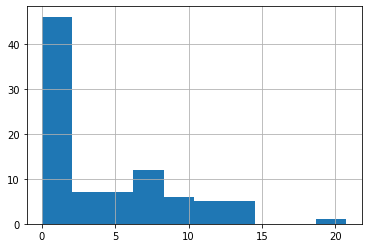

In [15]:
np.abs(y_test - model.predict(X_test)).hist()

In [23]:
features = ['type', *weather_features,
                                            *["tan " + col for col in direct_columns]]

In [24]:
len(features)

22

In [25]:
X = pd.get_dummies(ships_avg_weather[features]) # one hot type

y = ships_avg_weather['avg_speed']



X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)

In [26]:
## best estimator using random search 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)

regr_rf = RandomForestRegressor()

parameters = {'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}


model = RandomizedSearchCV(regr_rf, parameters, n_iter = 120, 
                         cv = 5, verbose=2, random_state=42,
                         n_jobs = -1)

model.fit(X_train, y_train)

print("---train---")
print("RMSE = ", np.sqrt(np.mean((model.predict(X_train) - y_train)**2)))
print("MAE = ", np.mean(np.abs(model.predict(X_train) - y_train)))

print("---test---")
print("RMSE = ", np.sqrt(np.mean((model.predict(X_test) - y_test)**2)))
print("MAE = ", np.mean(np.abs(model.predict(X_test) - y_test)))

print(model.best_params_)

Fitting 5 folds for each of 120 candidates, totalling 600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   17.1s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 600 out of 600 | elapsed:  8.8min finished


---train---
RMSE =  7.6315569261912e-07
MAE =  7.104648016562645e-08
---test---
RMSE =  5.606747723229434
MAE =  3.7165201824677068
{'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': None, 'bootstrap': False}


**Построение моделей без коррелированных фичей**

In [9]:
features = ['type', *weather_features,
                                            *["tan " + col for col in direct_columns]]

print("number of features, ", len(features) - len(corr_columns))

number of features,  20


In [43]:
data = ships_avg_weather

X = pd.get_dummies(data[features].drop(columns=corr_columns)) # one hot type

y = data['avg_speed']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)

rf = get_rf(X_train, X_test, y_train, y_test)

Fitting 4 folds for each of 150 candidates, totalling 600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   35.8s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 600 out of 600 | elapsed:  9.9min finished


---train---
RMSE =  6.884188286991657e-07
MAE =  6.141150658174403e-08
---test---
RMSE =  6.162919497348498
MAE =  3.8231270594655897
{'n_estimators': 1000, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 90, 'bootstrap': False}


### Модели на основе градиентного бустинга - подбор оптимальных гиперпараметров, получение метрик

In [37]:
from catboost import CatBoostRegressor
from catboost import Pool

import shap

In [8]:
features = ['type', *weather_features,
                                            *["tan " + col for col in direct_columns]]

модель без использования скоррелированных фичей

In [17]:
data = ships_avg_weather

X = pd.get_dummies(data[features].drop(columns=corr_columns)) # one hot type

y = data['avg_speed']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)

model = CatBoostRegressor()

grid = {'learning_rate': [0.03, 0.1],
        'depth': [4, 6, 8, 10],
        'l2_leaf_reg': [0, 0.1, 0.5, 1, 3, 5]}

randomized_search_result = model.grid_search(grid, cv=4,
                                                   X=X_train,
                                                   y=y_train,
                                                   plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	loss: 7.1745880	best: 7.1745880 (0)	total: 1.16s	remaining: 54.5s
1:	loss: 7.3520572	best: 7.1745880 (0)	total: 2.16s	remaining: 49.7s
2:	loss: 7.1843167	best: 7.1745880 (0)	total: 3.19s	remaining: 47.9s
3:	loss: 7.2623335	best: 7.1745880 (0)	total: 4.15s	remaining: 45.7s
4:	loss: 7.1698570	best: 7.1698570 (4)	total: 5.17s	remaining: 44.5s
5:	loss: 7.3031805	best: 7.1698570 (4)	total: 6.3s	remaining: 44.1s
6:	loss: 7.2341371	best: 7.1698570 (4)	total: 7.37s	remaining: 43.2s
7:	loss: 7.2437140	best: 7.1698570 (4)	total: 8.43s	remaining: 42.1s
8:	loss: 7.1255260	best: 7.1255260 (8)	total: 9.53s	remaining: 41.3s
9:	loss: 7.1580976	best: 7.1255260 (8)	total: 10.6s	remaining: 40.2s
10:	loss: 7.1548045	best: 7.1255260 (8)	total: 11.6s	remaining: 39s
11:	loss: 7.3788873	best: 7.1255260 (8)	total: 12.6s	remaining: 37.9s
12:	loss: 6.8805093	best: 6.8805093 (12)	total: 14.9s	remaining: 40s
13:	loss: 7.0932945	best: 6.8805093 (12)	total: 17.1s	remaining: 41.6s
14:	loss: 6.9937468	best: 6.88050

In [18]:
data = ships_avg_weather

X = pd.get_dummies(data[features].drop(columns=corr_columns)) # one hot type

y = data['avg_speed']

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)

model = CatBoostRegressor()

grid = {'learning_rate': [0.03, 0.1],
        'depth': [4, 6, 8, 10],
        'l2_leaf_reg': [0, 0.1, 0.5, 1, 3, 5]}

randomized_search_result = model.grid_search(grid, cv=4, train_size=0.85,
                                                   X=X,
                                                   y=y,
                                                   plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	loss: 6.6412871	best: 6.6412871 (0)	total: 1.17s	remaining: 55.1s
1:	loss: 6.7693890	best: 6.6412871 (0)	total: 2.21s	remaining: 50.9s
2:	loss: 6.5993660	best: 6.5993660 (2)	total: 3.34s	remaining: 50.2s
3:	loss: 6.5103545	best: 6.5103545 (3)	total: 4.35s	remaining: 47.8s
4:	loss: 6.8139553	best: 6.5103545 (3)	total: 5.33s	remaining: 45.9s
5:	loss: 6.5848943	best: 6.5103545 (3)	total: 6.42s	remaining: 44.9s
6:	loss: 6.7741719	best: 6.5103545 (3)	total: 7.5s	remaining: 43.9s
7:	loss: 6.6904452	best: 6.5103545 (3)	total: 8.54s	remaining: 42.7s
8:	loss: 6.9677665	best: 6.5103545 (3)	total: 9.63s	remaining: 41.7s
9:	loss: 6.6541427	best: 6.5103545 (3)	total: 10.9s	remaining: 41.3s
10:	loss: 6.9171756	best: 6.5103545 (3)	total: 12.2s	remaining: 41.1s
11:	loss: 6.8916959	best: 6.5103545 (3)	total: 13.2s	remaining: 39.7s
12:	loss: 6.5607179	best: 6.5103545 (3)	total: 15.3s	remaining: 41.1s
13:	loss: 6.7940920	best: 6.5103545 (3)	total: 17.3s	remaining: 41.9s
14:	loss: 6.5654264	best: 6.510

In [19]:
data = ships_avg_weather

X = pd.get_dummies(data[features].drop(columns=corr_columns)) # one hot type

y = data['avg_speed']

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)

model = CatBoostRegressor()

grid = {'learning_rate': [0.01, 0.03, 0.1],
        'depth': [4, 6, 8, 10],
        'l2_leaf_reg': [0, 0.1, 0.5, 1, 3, 5],
        'rsm' : [0.2, 0.5, 0.8, 1.0],
        'bootstrap_type' : ['No', 'Bernoulli']}

randomized_search_result = model.randomized_search(grid, cv=4, train_size=0.85, n_iter=100,
                                                   X=X,
                                                   y=y,
                                                   plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	loss: 6.6740546	best: 6.6740546 (0)	total: 1.07s	remaining: 1m 46s
1:	loss: 6.5788407	best: 6.5788407 (1)	total: 2.07s	remaining: 1m 41s
2:	loss: 6.6690696	best: 6.5788407 (1)	total: 3.14s	remaining: 1m 41s
3:	loss: 7.0449140	best: 6.5788407 (1)	total: 4.16s	remaining: 1m 39s
4:	loss: 6.7729577	best: 6.5788407 (1)	total: 5.16s	remaining: 1m 38s
5:	loss: 6.7266416	best: 6.5788407 (1)	total: 6.15s	remaining: 1m 36s
6:	loss: 6.7568486	best: 6.5788407 (1)	total: 7.36s	remaining: 1m 37s
7:	loss: 6.6476214	best: 6.5788407 (1)	total: 10.4s	remaining: 1m 59s
8:	loss: 6.4329141	best: 6.4329141 (8)	total: 13.5s	remaining: 2m 16s
9:	loss: 6.8030131	best: 6.4329141 (8)	total: 16.7s	remaining: 2m 30s
10:	loss: 6.7096566	best: 6.4329141 (8)	total: 19.7s	remaining: 2m 39s
11:	loss: 6.7039380	best: 6.4329141 (8)	total: 22.7s	remaining: 2m 46s
12:	loss: 6.5941900	best: 6.4329141 (8)	total: 25.8s	remaining: 2m 52s
13:	loss: 6.6065066	best: 6.4329141 (8)	total: 28.9s	remaining: 2m 57s
14:	loss: 6.5441

In [2]:
print("---test---")
print("RMSE = ", np.sqrt(np.mean((model.predict(X) - y)**2)))
print("MAE = ", np.mean(np.abs(model.predict(X) - y)))

---test---
RMSE =  5.912718166102189
MAE =  3.9220289197190845


Модель, использующая все признаки

In [24]:
data = ships_avg_weather

X = pd.get_dummies(data[features]) # one hot type

y = data['avg_speed']

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)

model = CatBoostRegressor()

grid = {'learning_rate': [0.01, 0.03, 0.1],
        'depth': [4, 6, 8, 10],
        'l2_leaf_reg': [0, 0.1, 0.5, 1, 3, 5],
        'rsm' : [0.2, 0.5, 0.8, 1.0],
        'bootstrap_type' : ['No', 'Bernoulli']}

randomized_search_result = model.randomized_search(grid, cv=4, train_size=0.85, n_iter=100,
                                                   X=X,
                                                   y=y,
                                                   plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	loss: 6.5508665	best: 6.5508665 (0)	total: 1.22s	remaining: 2m
1:	loss: 6.4990168	best: 6.4990168 (1)	total: 2.41s	remaining: 1m 58s
2:	loss: 6.7657820	best: 6.4990168 (1)	total: 3.48s	remaining: 1m 52s
3:	loss: 6.9215624	best: 6.4990168 (1)	total: 4.52s	remaining: 1m 48s
4:	loss: 6.6374775	best: 6.4990168 (1)	total: 5.55s	remaining: 1m 45s
5:	loss: 6.5176820	best: 6.4990168 (1)	total: 6.57s	remaining: 1m 42s
6:	loss: 6.6308087	best: 6.4990168 (1)	total: 7.63s	remaining: 1m 41s
7:	loss: 6.6126278	best: 6.4990168 (1)	total: 10.8s	remaining: 2m 3s
8:	loss: 6.5398182	best: 6.4990168 (1)	total: 14s	remaining: 2m 21s
9:	loss: 6.6454253	best: 6.4990168 (1)	total: 17.3s	remaining: 2m 35s
10:	loss: 6.6602961	best: 6.4990168 (1)	total: 20.4s	remaining: 2m 45s
11:	loss: 6.6612732	best: 6.4990168 (1)	total: 23.6s	remaining: 2m 52s
12:	loss: 6.5152673	best: 6.4990168 (1)	total: 26.9s	remaining: 2m 59s
13:	loss: 6.4587519	best: 6.4587519 (13)	total: 30.3s	remaining: 3m 5s
14:	loss: 6.7807087	bes

In [26]:
data = ships_avg_weather

X = pd.get_dummies(data[features]) # one hot type

y = data['avg_speed']

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)

model = CatBoostRegressor()

grid = {'learning_rate': [0.01, 0.03, 0.1],
        'depth': [4, 6, 8, 10],
        'l2_leaf_reg': [0, 0.1, 0.5, 1, 3, 5],
        'rsm' : [0.2, 0.5, 0.8],
        'bootstrap_type' : ['No', 'Bernoulli']}

randomized_search_result = model.randomized_search(grid, cv=4, train_size=0.85, n_iter=50,
                                                   X=X,
                                                   y=y,
                                                   plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	loss: 6.4990168	best: 6.4990168 (0)	total: 1.13s	remaining: 55.6s
1:	loss: 6.6743765	best: 6.4990168 (0)	total: 4.41s	remaining: 1m 45s
2:	loss: 6.6607419	best: 6.4990168 (0)	total: 7.64s	remaining: 1m 59s
3:	loss: 6.6454253	best: 6.4990168 (0)	total: 10.9s	remaining: 2m 5s
4:	loss: 6.5661501	best: 6.4990168 (0)	total: 14.2s	remaining: 2m 7s
5:	loss: 6.8263684	best: 6.4990168 (0)	total: 17.6s	remaining: 2m 8s
6:	loss: 6.6214100	best: 6.4990168 (0)	total: 24.4s	remaining: 2m 29s
7:	loss: 6.8421011	best: 6.4990168 (0)	total: 31.2s	remaining: 2m 43s
8:	loss: 6.5940024	best: 6.4990168 (0)	total: 38.2s	remaining: 2m 54s
9:	loss: 6.8179605	best: 6.4990168 (0)	total: 45s	remaining: 2m 59s
10:	loss: 7.1670172	best: 6.4990168 (0)	total: 56.9s	remaining: 3m 21s
11:	loss: 7.0558646	best: 6.4990168 (0)	total: 1m 8s	remaining: 3m 37s
12:	loss: 7.2771894	best: 6.4990168 (0)	total: 1m 22s	remaining: 3m 55s
13:	loss: 6.8781104	best: 6.4990168 (0)	total: 1m 36s	remaining: 4m 8s
14:	loss: 7.1931855	b

In [ ]:
def permutation_importances(model, X, y, metric):
    baseline = metric(model, X, y)
    imp = []
    for col in X.columns:
        save = X[col].copy()
        X[col] = np.random.permutation(X[col])
        m = metric(model, X, y)
        X[col] = save
        imp.append(m-baseline)
    return np.array(imp)

In [9]:
grouped_weather_features = [
    ['Temperature [2 m elevation corrected] (°C)',
    'Temperature [1000 mb] (°C)',
     'Temperature [850 mb] (°C)'],
     'Relative Humidity [2 m] (%)',
     'Mean Sea Level Pressure [MSL] (hPa)',
     'Precipitation Total (mm)',
     'Snowfall Amount (cm)',
     ['Cloud Cover Total (%)',
     'Cloud Cover High [high cld lay] (%)',
     'Cloud Cover Medium [mid cld lay] (%)',
     'Cloud Cover Low [low cld lay] (%)'],
     ['Wind Speed [10 m] (km/h)',
     'Wind Speed [80 m] (km/h)',
     'Wind Speed [900 mb] (km/h)',
     'Wind Speed [850 mb] (km/h)'],
     ['Geopotential Height [1000 mb] (Gpm)',
     'Geopotential Height [850 mb] (Gpm)']
                    ]

In [23]:
features = ['type', *weather_features,
                                            *["tan " + col for col in direct_columns]]

**Подбор оптимальной модели с помощью Randomized search**

In [25]:
data = ships_avg_weather

X = pd.get_dummies(data[features]) # one hot type

y = data['avg_speed']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)

model = CatBoostRegressor()

grid = {'learning_rate': [0.01, 0.03, 0.1],
        'depth': [4, 6, 8, 10],
        'l2_leaf_reg': [0, 0.1, 0.5, 1, 3, 5],
        'rsm' : [0.2, 0.5, 0.8, 1.0],
        'bootstrap_type' : ['No', 'Bernoulli']}

randomized_search_result = model.randomized_search(grid, cv=4, train_size=0.85,
                                                   n_iter=150,
                                                   X=X_train,
                                                   y=y_train,
                                                   plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	loss: 6.4008298	best: 6.4008298 (0)	total: 1.25s	remaining: 3m 5s
1:	loss: 6.4008298	best: 6.4008298 (0)	total: 2.48s	remaining: 3m 3s
2:	loss: 5.9366805	best: 5.9366805 (2)	total: 4.08s	remaining: 3m 19s
3:	loss: 5.8495528	best: 5.8495528 (3)	total: 5.55s	remaining: 3m 22s
4:	loss: 6.0817361	best: 5.8495528 (3)	total: 7.01s	remaining: 3m 23s
5:	loss: 5.8360068	best: 5.8360068 (5)	total: 8.19s	remaining: 3m 16s
6:	loss: 5.9917230	best: 5.8360068 (5)	total: 9.31s	remaining: 3m 10s
7:	loss: 6.5371036	best: 5.8360068 (5)	total: 10.5s	remaining: 3m 5s
8:	loss: 6.5586589	best: 5.8360068 (5)	total: 11.6s	remaining: 3m
9:	loss: 6.1304910	best: 5.8360068 (5)	total: 13s	remaining: 3m 2s
10:	loss: 6.1995815	best: 5.8360068 (5)	total: 14.8s	remaining: 3m 7s
11:	loss: 6.6428126	best: 5.8360068 (5)	total: 16.4s	remaining: 3m 8s
12:	loss: 6.1408457	best: 5.8360068 (5)	total: 17.9s	remaining: 3m 8s
13:	loss: 5.9252006	best: 5.8360068 (5)	total: 19.6s	remaining: 3m 10s
14:	loss: 5.8450519	best: 5.8

113:	loss: 5.8243727	best: 5.5227228 (63)	total: 22m 44s	remaining: 7m 10s
114:	loss: 5.6751459	best: 5.5227228 (63)	total: 22m 50s	remaining: 6m 56s
115:	loss: 5.9204111	best: 5.5227228 (63)	total: 22m 55s	remaining: 6m 43s
116:	loss: 5.9881216	best: 5.5227228 (63)	total: 23m	remaining: 6m 29s
117:	loss: 5.9241885	best: 5.5227228 (63)	total: 23m 5s	remaining: 6m 15s
118:	loss: 5.9056532	best: 5.5227228 (63)	total: 23m 9s	remaining: 6m 2s
119:	loss: 5.8989782	best: 5.5227228 (63)	total: 23m 14s	remaining: 5m 48s
120:	loss: 6.0376396	best: 5.5227228 (63)	total: 23m 18s	remaining: 5m 35s
121:	loss: 6.0026454	best: 5.5227228 (63)	total: 23m 22s	remaining: 5m 21s
122:	loss: 5.8607802	best: 5.5227228 (63)	total: 23m 27s	remaining: 5m 9s
123:	loss: 5.7987234	best: 5.5227228 (63)	total: 23m 32s	remaining: 4m 56s
124:	loss: 5.7726435	best: 5.5227228 (63)	total: 23m 36s	remaining: 4m 43s
125:	loss: 6.0138303	best: 5.5227228 (63)	total: 23m 40s	remaining: 4m 30s
126:	loss: 6.0644745	best: 5.5227

In [28]:
randomized_search_result['params']

{'depth': 8,
 'l2_leaf_reg': 5,
 'rsm': 0.5,
 'learning_rate': 0.1,
 'bootstrap_type': 'Bernoulli'}

In [27]:
#use of model after search

print("---train---")    
print("RMSE = ", np.sqrt(np.mean((model.predict(X_train) - y_train)**2)))
print("MAE = ", np.mean(np.abs(model.predict(X_train) - y_train)))

print("---test---")
print("RMSE = ", np.sqrt(np.mean((model.predict(X_test) - y_test)**2)))
print("MAE = ", np.mean(np.abs(model.predict(X_test) - y_test)))

---train---
RMSE =  0.18989486411506346
MAE =  0.13619790138322657
---test---
RMSE =  7.314498987004303
MAE =  4.476906586405487


In [29]:
#use of the best model

data = ships_avg_weather

X = pd.get_dummies(data[features]) # one hot type

y = data['avg_speed']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)

model = CatBoostRegressor(depth= 8,
                            l2_leaf_reg= 5,
                         rsm= 0.5,
                         learning_rate= 0.1,
                         bootstrap_type= 'Bernoulli')

model.fit(X_train, y_train)

0:	learn: 8.3836695	total: 7.12ms	remaining: 7.11s
1:	learn: 8.2084691	total: 17.9ms	remaining: 8.91s
2:	learn: 8.0622829	total: 29.1ms	remaining: 9.67s
3:	learn: 7.9418656	total: 41.7ms	remaining: 10.4s
4:	learn: 7.8331180	total: 52.5ms	remaining: 10.4s
5:	learn: 7.7196306	total: 63.7ms	remaining: 10.5s
6:	learn: 7.5779656	total: 73.8ms	remaining: 10.5s
7:	learn: 7.4793659	total: 87ms	remaining: 10.8s
8:	learn: 7.3657545	total: 98.5ms	remaining: 10.8s
9:	learn: 7.2627257	total: 111ms	remaining: 11s
10:	learn: 7.1631066	total: 124ms	remaining: 11.1s
11:	learn: 7.0553377	total: 135ms	remaining: 11.1s
12:	learn: 6.9541505	total: 145ms	remaining: 11s
13:	learn: 6.8659575	total: 157ms	remaining: 11s
14:	learn: 6.7728316	total: 168ms	remaining: 11s
15:	learn: 6.6976438	total: 180ms	remaining: 11.1s
16:	learn: 6.6186276	total: 190ms	remaining: 11s
17:	learn: 6.5492750	total: 202ms	remaining: 11s
18:	learn: 6.4851668	total: 214ms	remaining: 11s
19:	learn: 6.4202562	total: 224ms	remaining: 11s

171:	learn: 2.4863367	total: 2.06s	remaining: 9.92s
172:	learn: 2.4716586	total: 2.07s	remaining: 9.9s
173:	learn: 2.4522657	total: 2.08s	remaining: 9.89s
174:	learn: 2.4350188	total: 2.1s	remaining: 9.88s
175:	learn: 2.4200002	total: 2.11s	remaining: 9.86s
176:	learn: 2.4119338	total: 2.12s	remaining: 9.85s
177:	learn: 2.3977177	total: 2.13s	remaining: 9.84s
178:	learn: 2.3959360	total: 2.14s	remaining: 9.83s
179:	learn: 2.3794269	total: 2.15s	remaining: 9.81s
180:	learn: 2.3680857	total: 2.17s	remaining: 9.8s
181:	learn: 2.3649194	total: 2.18s	remaining: 9.79s
182:	learn: 2.3581120	total: 2.19s	remaining: 9.78s
183:	learn: 2.3419504	total: 2.2s	remaining: 9.76s
184:	learn: 2.3309177	total: 2.21s	remaining: 9.75s
185:	learn: 2.3231170	total: 2.23s	remaining: 9.74s
186:	learn: 2.3150067	total: 2.24s	remaining: 9.73s
187:	learn: 2.3042453	total: 2.25s	remaining: 9.72s
188:	learn: 2.2873621	total: 2.26s	remaining: 9.71s
189:	learn: 2.2697384	total: 2.27s	remaining: 9.7s
190:	learn: 2.250

343:	learn: 1.1719638	total: 4.15s	remaining: 7.92s
344:	learn: 1.1672853	total: 4.17s	remaining: 7.91s
345:	learn: 1.1634943	total: 4.18s	remaining: 7.89s
346:	learn: 1.1556538	total: 4.19s	remaining: 7.88s
347:	learn: 1.1509970	total: 4.2s	remaining: 7.87s
348:	learn: 1.1434148	total: 4.21s	remaining: 7.86s
349:	learn: 1.1391034	total: 4.23s	remaining: 7.85s
350:	learn: 1.1380375	total: 4.24s	remaining: 7.83s
351:	learn: 1.1348124	total: 4.25s	remaining: 7.82s
352:	learn: 1.1297626	total: 4.26s	remaining: 7.82s
353:	learn: 1.1281853	total: 4.28s	remaining: 7.81s
354:	learn: 1.1271553	total: 4.29s	remaining: 7.8s
355:	learn: 1.1239806	total: 4.3s	remaining: 7.78s
356:	learn: 1.1192686	total: 4.31s	remaining: 7.77s
357:	learn: 1.1138664	total: 4.33s	remaining: 7.76s
358:	learn: 1.1098762	total: 4.34s	remaining: 7.75s
359:	learn: 1.1068997	total: 4.35s	remaining: 7.74s
360:	learn: 1.1029400	total: 4.36s	remaining: 7.72s
361:	learn: 1.1010661	total: 4.38s	remaining: 7.71s
362:	learn: 1.0

507:	learn: 0.6717445	total: 6.1s	remaining: 5.9s
508:	learn: 0.6700951	total: 6.11s	remaining: 5.89s
509:	learn: 0.6690905	total: 6.12s	remaining: 5.88s
510:	learn: 0.6662712	total: 6.13s	remaining: 5.87s
511:	learn: 0.6622417	total: 6.14s	remaining: 5.85s
512:	learn: 0.6585489	total: 6.16s	remaining: 5.84s
513:	learn: 0.6567480	total: 6.17s	remaining: 5.83s
514:	learn: 0.6552136	total: 6.18s	remaining: 5.82s
515:	learn: 0.6540681	total: 6.19s	remaining: 5.8s
516:	learn: 0.6513856	total: 6.2s	remaining: 5.79s
517:	learn: 0.6493716	total: 6.21s	remaining: 5.78s
518:	learn: 0.6480316	total: 6.22s	remaining: 5.77s
519:	learn: 0.6462982	total: 6.24s	remaining: 5.76s
520:	learn: 0.6439312	total: 6.25s	remaining: 5.74s
521:	learn: 0.6425324	total: 6.26s	remaining: 5.73s
522:	learn: 0.6399457	total: 6.27s	remaining: 5.72s
523:	learn: 0.6387637	total: 6.29s	remaining: 5.71s
524:	learn: 0.6385081	total: 6.3s	remaining: 5.7s
525:	learn: 0.6356167	total: 6.31s	remaining: 5.68s
526:	learn: 0.6354

672:	learn: 0.4190459	total: 8.17s	remaining: 3.97s
673:	learn: 0.4174031	total: 8.18s	remaining: 3.96s
674:	learn: 0.4161881	total: 8.2s	remaining: 3.95s
675:	learn: 0.4153629	total: 8.21s	remaining: 3.93s
676:	learn: 0.4148821	total: 8.22s	remaining: 3.92s
677:	learn: 0.4143388	total: 8.23s	remaining: 3.91s
678:	learn: 0.4129045	total: 8.24s	remaining: 3.9s
679:	learn: 0.4117410	total: 8.26s	remaining: 3.88s
680:	learn: 0.4105983	total: 8.27s	remaining: 3.87s
681:	learn: 0.4095687	total: 8.28s	remaining: 3.86s
682:	learn: 0.4080784	total: 8.29s	remaining: 3.85s
683:	learn: 0.4071438	total: 8.3s	remaining: 3.83s
684:	learn: 0.4064680	total: 8.31s	remaining: 3.82s
685:	learn: 0.4054346	total: 8.32s	remaining: 3.81s
686:	learn: 0.4044170	total: 8.34s	remaining: 3.8s
687:	learn: 0.4032173	total: 8.35s	remaining: 3.79s
688:	learn: 0.4020448	total: 8.36s	remaining: 3.77s
689:	learn: 0.4010043	total: 8.38s	remaining: 3.76s
690:	learn: 0.3994232	total: 8.39s	remaining: 3.75s
691:	learn: 0.39

842:	learn: 0.2800080	total: 10.3s	remaining: 1.91s
843:	learn: 0.2796964	total: 10.3s	remaining: 1.9s
844:	learn: 0.2793204	total: 10.3s	remaining: 1.89s
845:	learn: 0.2789079	total: 10.3s	remaining: 1.87s
846:	learn: 0.2783255	total: 10.3s	remaining: 1.86s
847:	learn: 0.2780062	total: 10.3s	remaining: 1.85s
848:	learn: 0.2777320	total: 10.3s	remaining: 1.84s
849:	learn: 0.2772709	total: 10.3s	remaining: 1.83s
850:	learn: 0.2767821	total: 10.4s	remaining: 1.81s
851:	learn: 0.2761011	total: 10.4s	remaining: 1.8s
852:	learn: 0.2759579	total: 10.4s	remaining: 1.79s
853:	learn: 0.2754774	total: 10.4s	remaining: 1.78s
854:	learn: 0.2751879	total: 10.4s	remaining: 1.76s
855:	learn: 0.2746433	total: 10.4s	remaining: 1.75s
856:	learn: 0.2745107	total: 10.4s	remaining: 1.74s
857:	learn: 0.2739085	total: 10.4s	remaining: 1.73s
858:	learn: 0.2730992	total: 10.5s	remaining: 1.72s
859:	learn: 0.2727901	total: 10.5s	remaining: 1.71s
860:	learn: 0.2723971	total: 10.5s	remaining: 1.69s
861:	learn: 0.

In [38]:
#use of the best model

print("---train---")
print("RMSE = ", np.sqrt(np.mean((model.predict(X_train) - y_train)**2)))
print("MAE = ", np.mean(np.abs(model.predict(X_train) - y_train)))

print("---test---")
print("RMSE = ", np.sqrt(np.mean((model.predict(X_test) - y_test)**2)))
print("MAE = ", np.mean(np.abs(model.predict(X_test) - y_test)))

---train---
RMSE =  0.20575790690240145
MAE =  0.1433499855058793
---test---
RMSE =  5.645365848358678
MAE =  4.0238991266012745


model with dropped correlated columns 

In [10]:
data = ships_avg_weather

X = pd.get_dummies(data[features].drop(columns=corr_columns)) # one hot type

y = data['avg_speed']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)

model = CatBoostRegressor()

grid = {'learning_rate': [0.01, 0.03, 0.1],
        'depth': [4, 6, 8, 10],
        'l2_leaf_reg': [0, 0.1, 0.5, 1, 3, 5],
        'rsm' : [0.2, 0.5, 0.8, 1.0],
        'bootstrap_type' : ['No', 'Bernoulli']}

randomized_search_result = model.randomized_search(grid, cv=4, train_size=0.85,
                                                   n_iter=100,
                                                   X=X_train,
                                                   y=y_train,
                                                   plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	loss: 6.9975203	best: 6.9975203 (0)	total: 1.1s	remaining: 1m 48s
1:	loss: 7.0256014	best: 6.9975203 (0)	total: 1.96s	remaining: 1m 36s
2:	loss: 7.0802229	best: 6.9975203 (0)	total: 3.01s	remaining: 1m 37s
3:	loss: 7.6556927	best: 6.9975203 (0)	total: 3.91s	remaining: 1m 33s
4:	loss: 7.0802781	best: 6.9975203 (0)	total: 4.88s	remaining: 1m 32s
5:	loss: 7.1963285	best: 6.9975203 (0)	total: 5.85s	remaining: 1m 31s
6:	loss: 7.1867071	best: 6.9975203 (0)	total: 7.1s	remaining: 1m 34s
7:	loss: 6.9698039	best: 6.9698039 (7)	total: 10.8s	remaining: 2m 4s
8:	loss: 6.8876633	best: 6.8876633 (8)	total: 14.7s	remaining: 2m 28s
9:	loss: 7.0179380	best: 6.8876633 (8)	total: 18.6s	remaining: 2m 47s
10:	loss: 7.0635965	best: 6.8876633 (8)	total: 22.6s	remaining: 3m 2s
11:	loss: 7.2086681	best: 6.8876633 (8)	total: 26.7s	remaining: 3m 15s
12:	loss: 6.9750506	best: 6.8876633 (8)	total: 30.2s	remaining: 3m 21s
13:	loss: 6.9780782	best: 6.8876633 (8)	total: 33.9s	remaining: 3m 28s
14:	loss: 6.8653252	

In [21]:
print("---train---")
print("RMSE = ", np.sqrt(np.mean((model.predict(X_train) - y_train)**2)))
print("MAE = ", np.mean(np.abs(model.predict(X_train) - y_train)))

print("---test---")
print("RMSE = ", np.sqrt(np.mean((model.predict(X_test) - y_test)**2)))
print("MAE = ", np.mean(np.abs(model.predict(X_test) - y_test)))

---train---
RMSE =  0.021031726363093736
MAE =  0.01709123693920154
---test---
RMSE =  7.497657116326376
MAE =  5.062863290503952


Модель, использующая только грузовые корабли

In [50]:
data = ships_avg_weather[ships_avg_weather.type == "Cargo ship"]

X = pd.get_dummies(data[features[1:]]) # one hot type

y = data['avg_speed']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)

model = CatBoostRegressor()

grid = {'learning_rate': [0.01, 0.03, 0.1],
        'depth': [4, 6, 8, 10],
        'l2_leaf_reg': [0, 0.1, 0.5, 1, 3, 5],
        'rsm' : [0.2, 0.5, 0.8, 1.0],
        'bootstrap_type' : ['No', 'Bernoulli']}

randomized_search_result = model.randomized_search(grid, cv=4, train_size=0.85,
                                                   n_iter=150,
                                                   X=X_train,
                                                   y=y_train,
                                                   plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	loss: 6.9313393	best: 6.9313393 (0)	total: 1.39s	remaining: 3m 27s
1:	loss: 6.9313393	best: 6.9313393 (0)	total: 2.31s	remaining: 2m 50s
2:	loss: 6.9321124	best: 6.9313393 (0)	total: 3.3s	remaining: 2m 41s
3:	loss: 6.5092867	best: 6.5092867 (3)	total: 4.23s	remaining: 2m 34s
4:	loss: 6.8610632	best: 6.5092867 (3)	total: 5.14s	remaining: 2m 28s
5:	loss: 6.5097056	best: 6.5092867 (3)	total: 6.05s	remaining: 2m 25s
6:	loss: 6.6150557	best: 6.5092867 (3)	total: 6.94s	remaining: 2m 21s
7:	loss: 6.8970360	best: 6.5092867 (3)	total: 7.87s	remaining: 2m 19s
8:	loss: 6.9228578	best: 6.5092867 (3)	total: 8.94s	remaining: 2m 19s
9:	loss: 6.9361718	best: 6.5092867 (3)	total: 9.81s	remaining: 2m 17s
10:	loss: 6.8284926	best: 6.5092867 (3)	total: 10.7s	remaining: 2m 15s
11:	loss: 6.9568801	best: 6.5092867 (3)	total: 11.6s	remaining: 2m 13s
12:	loss: 6.9915421	best: 6.5092867 (3)	total: 12.6s	remaining: 2m 12s
13:	loss: 6.6719721	best: 6.5092867 (3)	total: 13.4s	remaining: 2m 10s
14:	loss: 6.96338

114:	loss: 7.1491191	best: 6.4972519 (87)	total: 20m 10s	remaining: 6m 8s
115:	loss: 7.1637911	best: 6.4972519 (87)	total: 20m 14s	remaining: 5m 55s
116:	loss: 6.9669548	best: 6.4972519 (87)	total: 20m 17s	remaining: 5m 43s
117:	loss: 7.1528125	best: 6.4972519 (87)	total: 20m 20s	remaining: 5m 31s
118:	loss: 7.3313688	best: 6.4972519 (87)	total: 20m 23s	remaining: 5m 18s
119:	loss: 7.1063137	best: 6.4972519 (87)	total: 20m 27s	remaining: 5m 6s
120:	loss: 7.1197337	best: 6.4972519 (87)	total: 20m 30s	remaining: 4m 54s
121:	loss: 7.0150996	best: 6.4972519 (87)	total: 20m 33s	remaining: 4m 43s
122:	loss: 7.0719574	best: 6.4972519 (87)	total: 20m 36s	remaining: 4m 31s
123:	loss: 7.5389322	best: 6.4972519 (87)	total: 20m 39s	remaining: 4m 19s
124:	loss: 6.9539647	best: 6.4972519 (87)	total: 20m 43s	remaining: 4m 8s
125:	loss: 7.1675527	best: 6.4972519 (87)	total: 20m 46s	remaining: 3m 57s
126:	loss: 7.0990122	best: 6.4972519 (87)	total: 20m 49s	remaining: 3m 46s
127:	loss: 7.4071619	best: 6

In [51]:
randomized_search_result['params']

{'depth': 6,
 'rsm': 0.8,
 'learning_rate': 0.1,
 'l2_leaf_reg': 0.1,
 'bootstrap_type': 'No'}

In [66]:
#use of the best model

data = ships_avg_weather[ships_avg_weather.type == "Cargo ship"]

X = data[features[1:]] # one hot type

y = data['avg_speed']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)

model = CatBoostRegressor(depth= 6,
                            l2_leaf_reg= 0.1,
                         rsm= 0.8,
                         learning_rate= 0.1,
                         bootstrap_type= 'No')

model.fit(X_train, y_train)

0:	learn: 7.4183415	total: 3.98ms	remaining: 3.98s
1:	learn: 7.2950250	total: 7.09ms	remaining: 3.54s
2:	learn: 7.1592663	total: 12.9ms	remaining: 4.29s
3:	learn: 7.0426759	total: 17.7ms	remaining: 4.4s
4:	learn: 6.9040829	total: 23.7ms	remaining: 4.72s
5:	learn: 6.7844322	total: 27.2ms	remaining: 4.51s
6:	learn: 6.6717740	total: 34ms	remaining: 4.82s
7:	learn: 6.5841887	total: 37.6ms	remaining: 4.66s
8:	learn: 6.4585176	total: 44.6ms	remaining: 4.92s
9:	learn: 6.3643816	total: 47.6ms	remaining: 4.72s
10:	learn: 6.2869052	total: 54.6ms	remaining: 4.91s
11:	learn: 6.1942034	total: 57.5ms	remaining: 4.73s
12:	learn: 6.0977299	total: 64.9ms	remaining: 4.93s
13:	learn: 5.9976448	total: 70.6ms	remaining: 4.97s
14:	learn: 5.9368753	total: 78ms	remaining: 5.12s
15:	learn: 5.8791186	total: 83.6ms	remaining: 5.14s
16:	learn: 5.8150446	total: 92ms	remaining: 5.32s
17:	learn: 5.7384184	total: 97.9ms	remaining: 5.34s
18:	learn: 5.6610121	total: 107ms	remaining: 5.54s
19:	learn: 5.5942490	total: 11

181:	learn: 0.8612826	total: 1.25s	remaining: 5.63s
182:	learn: 0.8527328	total: 1.26s	remaining: 5.61s
183:	learn: 0.8403425	total: 1.26s	remaining: 5.61s
184:	learn: 0.8311405	total: 1.27s	remaining: 5.59s
185:	learn: 0.8267414	total: 1.28s	remaining: 5.59s
186:	learn: 0.8219946	total: 1.28s	remaining: 5.58s
187:	learn: 0.8170316	total: 1.29s	remaining: 5.58s
188:	learn: 0.8099897	total: 1.3s	remaining: 5.56s
189:	learn: 0.7974808	total: 1.3s	remaining: 5.56s
190:	learn: 0.7901355	total: 1.31s	remaining: 5.55s
191:	learn: 0.7778569	total: 1.32s	remaining: 5.55s
192:	learn: 0.7665595	total: 1.32s	remaining: 5.54s
193:	learn: 0.7619446	total: 1.33s	remaining: 5.54s
194:	learn: 0.7516116	total: 1.34s	remaining: 5.53s
195:	learn: 0.7414892	total: 1.35s	remaining: 5.53s
196:	learn: 0.7353120	total: 1.35s	remaining: 5.51s
197:	learn: 0.7236730	total: 1.36s	remaining: 5.51s
198:	learn: 0.7152985	total: 1.37s	remaining: 5.5s
199:	learn: 0.7062889	total: 1.38s	remaining: 5.5s
200:	learn: 0.69

350:	learn: 0.1945425	total: 2.31s	remaining: 4.27s
351:	learn: 0.1935555	total: 2.31s	remaining: 4.26s
352:	learn: 0.1919203	total: 2.32s	remaining: 4.25s
353:	learn: 0.1907269	total: 2.33s	remaining: 4.24s
354:	learn: 0.1897154	total: 2.33s	remaining: 4.24s
355:	learn: 0.1881500	total: 2.34s	remaining: 4.23s
356:	learn: 0.1864466	total: 2.34s	remaining: 4.22s
357:	learn: 0.1843288	total: 2.35s	remaining: 4.21s
358:	learn: 0.1832724	total: 2.35s	remaining: 4.2s
359:	learn: 0.1811076	total: 2.36s	remaining: 4.2s
360:	learn: 0.1801122	total: 2.37s	remaining: 4.19s
361:	learn: 0.1793480	total: 2.38s	remaining: 4.19s
362:	learn: 0.1783698	total: 2.38s	remaining: 4.18s
363:	learn: 0.1766433	total: 2.39s	remaining: 4.17s
364:	learn: 0.1756968	total: 2.4s	remaining: 4.17s
365:	learn: 0.1744955	total: 2.4s	remaining: 4.16s
366:	learn: 0.1737970	total: 2.41s	remaining: 4.16s
367:	learn: 0.1725795	total: 2.42s	remaining: 4.16s
368:	learn: 0.1707612	total: 2.43s	remaining: 4.15s
369:	learn: 0.16

509:	learn: 0.0667839	total: 3.37s	remaining: 3.23s
510:	learn: 0.0663504	total: 3.37s	remaining: 3.23s
511:	learn: 0.0660971	total: 3.38s	remaining: 3.22s
512:	learn: 0.0655388	total: 3.39s	remaining: 3.22s
513:	learn: 0.0649766	total: 3.4s	remaining: 3.21s
514:	learn: 0.0645023	total: 3.4s	remaining: 3.21s
515:	learn: 0.0640297	total: 3.41s	remaining: 3.2s
516:	learn: 0.0637862	total: 3.42s	remaining: 3.19s
517:	learn: 0.0634826	total: 3.42s	remaining: 3.18s
518:	learn: 0.0632245	total: 3.42s	remaining: 3.17s
519:	learn: 0.0627687	total: 3.43s	remaining: 3.17s
520:	learn: 0.0623260	total: 3.44s	remaining: 3.16s
521:	learn: 0.0618684	total: 3.44s	remaining: 3.15s
522:	learn: 0.0614122	total: 3.45s	remaining: 3.15s
523:	learn: 0.0609656	total: 3.46s	remaining: 3.14s
524:	learn: 0.0605676	total: 3.47s	remaining: 3.14s
525:	learn: 0.0600548	total: 3.48s	remaining: 3.13s
526:	learn: 0.0595839	total: 3.48s	remaining: 3.13s
527:	learn: 0.0592633	total: 3.49s	remaining: 3.12s
528:	learn: 0.0

694:	learn: 0.0215806	total: 4.61s	remaining: 2.02s
695:	learn: 0.0214141	total: 4.61s	remaining: 2.01s
696:	learn: 0.0212755	total: 4.62s	remaining: 2.01s
697:	learn: 0.0211729	total: 4.62s	remaining: 2s
698:	learn: 0.0210527	total: 4.63s	remaining: 1.99s
699:	learn: 0.0209482	total: 4.63s	remaining: 1.99s
700:	learn: 0.0208012	total: 4.63s	remaining: 1.98s
701:	learn: 0.0206409	total: 4.64s	remaining: 1.97s
702:	learn: 0.0205622	total: 4.64s	remaining: 1.96s
703:	learn: 0.0204681	total: 4.65s	remaining: 1.96s
704:	learn: 0.0203864	total: 4.65s	remaining: 1.95s
705:	learn: 0.0203076	total: 4.66s	remaining: 1.94s
706:	learn: 0.0201458	total: 4.66s	remaining: 1.93s
707:	learn: 0.0200216	total: 4.67s	remaining: 1.93s
708:	learn: 0.0199201	total: 4.67s	remaining: 1.92s
709:	learn: 0.0198058	total: 4.68s	remaining: 1.91s
710:	learn: 0.0196584	total: 4.68s	remaining: 1.9s
711:	learn: 0.0195231	total: 4.69s	remaining: 1.9s
712:	learn: 0.0194215	total: 4.69s	remaining: 1.89s
713:	learn: 0.019

862:	learn: 0.0087473	total: 5.67s	remaining: 899ms
863:	learn: 0.0086896	total: 5.67s	remaining: 893ms
864:	learn: 0.0086657	total: 5.68s	remaining: 886ms
865:	learn: 0.0086127	total: 5.68s	remaining: 880ms
866:	learn: 0.0085677	total: 5.69s	remaining: 873ms
867:	learn: 0.0085009	total: 5.7s	remaining: 867ms
868:	learn: 0.0084448	total: 5.7s	remaining: 860ms
869:	learn: 0.0084056	total: 5.71s	remaining: 853ms
870:	learn: 0.0083721	total: 5.72s	remaining: 847ms
871:	learn: 0.0083326	total: 5.72s	remaining: 840ms
872:	learn: 0.0082921	total: 5.73s	remaining: 834ms
873:	learn: 0.0082633	total: 5.74s	remaining: 827ms
874:	learn: 0.0082378	total: 5.74s	remaining: 821ms
875:	learn: 0.0081853	total: 5.75s	remaining: 814ms
876:	learn: 0.0081400	total: 5.76s	remaining: 808ms
877:	learn: 0.0080797	total: 5.77s	remaining: 801ms
878:	learn: 0.0080557	total: 5.77s	remaining: 795ms
879:	learn: 0.0079947	total: 5.78s	remaining: 788ms
880:	learn: 0.0079610	total: 5.79s	remaining: 782ms
881:	learn: 0.

In [67]:
print("---train---")
print("RMSE = ", np.sqrt(np.mean((model.predict(X_train) - y_train)**2)))
print("MAE = ", np.mean(np.abs(model.predict(X_train) - y_train)))

print("---test---")
print("RMSE = ", np.sqrt(np.mean((model.predict(X_test) - y_test)**2)))
print("MAE = ", np.mean(np.abs(model.predict(X_test) - y_test)))

---train---
RMSE =  0.00415305306447002
MAE =  0.0033346385449686444
---test---
RMSE =  5.121219128830994
MAE =  3.2803625158808165


только Танкеры

In [68]:
data = ships_avg_weather[ships_avg_weather.type == "Tanker"]

X = pd.get_dummies(data[features[1:]]) # one hot type

y = data['avg_speed']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)

model = CatBoostRegressor()

grid = {'learning_rate': [0.01, 0.03, 0.1],
        'depth': [4, 6, 8, 10],
        'l2_leaf_reg': [0, 0.1, 0.5, 1, 3, 5],
        'rsm' : [0.2, 0.5, 0.8, 1.0],
        'bootstrap_type' : ['No', 'Bernoulli']}

randomized_search_result = model.randomized_search(grid, cv=4, train_size=0.85,
                                                   n_iter=150,
                                                   X=X_train,
                                                   y=y_train,
                                                   plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	loss: 6.9922764	best: 6.9922764 (0)	total: 1.08s	remaining: 2m 41s
1:	loss: 6.9922764	best: 6.9922764 (0)	total: 2.14s	remaining: 2m 38s
2:	loss: 6.6492227	best: 6.6492227 (2)	total: 3.21s	remaining: 2m 37s
3:	loss: 6.8351508	best: 6.6492227 (2)	total: 4.34s	remaining: 2m 38s
4:	loss: 6.5800316	best: 6.5800316 (4)	total: 5.45s	remaining: 2m 38s
5:	loss: 6.9919472	best: 6.5800316 (4)	total: 6.86s	remaining: 2m 44s
6:	loss: 7.0276398	best: 6.5800316 (4)	total: 8.23s	remaining: 2m 48s
7:	loss: 7.1504873	best: 6.5800316 (4)	total: 9.43s	remaining: 2m 47s
8:	loss: 7.1989553	best: 6.5800316 (4)	total: 10.7s	remaining: 2m 47s
9:	loss: 6.7011189	best: 6.5800316 (4)	total: 11.8s	remaining: 2m 44s
10:	loss: 6.8252378	best: 6.5800316 (4)	total: 13.1s	remaining: 2m 45s
11:	loss: 7.3285783	best: 6.5800316 (4)	total: 14.2s	remaining: 2m 43s
12:	loss: 6.8512725	best: 6.5800316 (4)	total: 15.4s	remaining: 2m 42s
13:	loss: 6.3454477	best: 6.3454477 (13)	total: 16.5s	remaining: 2m 40s
14:	loss: 6.414

114:	loss: 6.8275152	best: 6.0504488 (48)	total: 11m 41s	remaining: 3m 33s
115:	loss: 6.5577072	best: 6.0504488 (48)	total: 11m 43s	remaining: 3m 26s
116:	loss: 6.5863229	best: 6.0504488 (48)	total: 11m 45s	remaining: 3m 19s
117:	loss: 6.4457469	best: 6.0504488 (48)	total: 11m 47s	remaining: 3m 11s
118:	loss: 6.7834953	best: 6.0504488 (48)	total: 11m 49s	remaining: 3m 4s
119:	loss: 6.2526387	best: 6.0504488 (48)	total: 11m 51s	remaining: 2m 57s
120:	loss: 6.7227981	best: 6.0504488 (48)	total: 11m 54s	remaining: 2m 51s
121:	loss: 6.7548837	best: 6.0504488 (48)	total: 11m 56s	remaining: 2m 44s
122:	loss: 6.3765501	best: 6.0504488 (48)	total: 11m 58s	remaining: 2m 37s
123:	loss: 6.6890577	best: 6.0504488 (48)	total: 12m	remaining: 2m 31s
124:	loss: 6.5375698	best: 6.0504488 (48)	total: 12m 3s	remaining: 2m 24s
125:	loss: 6.7208381	best: 6.0504488 (48)	total: 12m 5s	remaining: 2m 18s
126:	loss: 6.8593939	best: 6.0504488 (48)	total: 12m 7s	remaining: 2m 11s
127:	loss: 6.7873068	best: 6.0504

In [69]:
randomized_search_result['params']

{'depth': 6,
 'rsm': 0.5,
 'learning_rate': 0.1,
 'l2_leaf_reg': 0.1,
 'bootstrap_type': 'No'}

In [78]:
#use of the best model

data = ships_avg_weather[ships_avg_weather.type == "Tanker"]

X = data[features[1:]] # one hot type

y = data['avg_speed']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)

model = CatBoostRegressor(depth= 6,
                            l2_leaf_reg= 0.1,
                         rsm= 0.5,
                         learning_rate= 0.1,
                         bootstrap_type= 'No')

model.fit(X_train, y_train)

0:	learn: 7.8846573	total: 2.17ms	remaining: 2.17s
1:	learn: 7.6193665	total: 7.22ms	remaining: 3.6s
2:	learn: 7.1920041	total: 9.74ms	remaining: 3.24s
3:	learn: 6.9683476	total: 12.5ms	remaining: 3.1s
4:	learn: 6.7313859	total: 15.4ms	remaining: 3.06s
5:	learn: 6.5556643	total: 18.6ms	remaining: 3.07s
6:	learn: 6.3084463	total: 21.2ms	remaining: 3.01s
7:	learn: 6.0502807	total: 24ms	remaining: 2.98s
8:	learn: 5.8460661	total: 26.6ms	remaining: 2.93s
9:	learn: 5.6576356	total: 30.7ms	remaining: 3.03s
10:	learn: 5.4239756	total: 33.2ms	remaining: 2.98s
11:	learn: 5.3382759	total: 36.1ms	remaining: 2.97s
12:	learn: 5.1160121	total: 39.8ms	remaining: 3.02s
13:	learn: 4.9114661	total: 43.5ms	remaining: 3.06s
14:	learn: 4.8457474	total: 47.6ms	remaining: 3.12s
15:	learn: 4.7466741	total: 49.7ms	remaining: 3.05s
16:	learn: 4.6300826	total: 53.2ms	remaining: 3.08s
17:	learn: 4.5512016	total: 56.8ms	remaining: 3.1s
18:	learn: 4.4646073	total: 59.6ms	remaining: 3.08s
19:	learn: 4.2811377	total:

199:	learn: 0.0500420	total: 688ms	remaining: 2.75s
200:	learn: 0.0491865	total: 692ms	remaining: 2.75s
201:	learn: 0.0480580	total: 697ms	remaining: 2.75s
202:	learn: 0.0468626	total: 701ms	remaining: 2.75s
203:	learn: 0.0458439	total: 704ms	remaining: 2.75s
204:	learn: 0.0449649	total: 709ms	remaining: 2.75s
205:	learn: 0.0439797	total: 712ms	remaining: 2.74s
206:	learn: 0.0433309	total: 715ms	remaining: 2.74s
207:	learn: 0.0422591	total: 718ms	remaining: 2.73s
208:	learn: 0.0414142	total: 720ms	remaining: 2.73s
209:	learn: 0.0405701	total: 723ms	remaining: 2.72s
210:	learn: 0.0398083	total: 726ms	remaining: 2.71s
211:	learn: 0.0392856	total: 728ms	remaining: 2.71s
212:	learn: 0.0384064	total: 730ms	remaining: 2.7s
213:	learn: 0.0378041	total: 732ms	remaining: 2.69s
214:	learn: 0.0371995	total: 735ms	remaining: 2.68s
215:	learn: 0.0360239	total: 741ms	remaining: 2.69s
216:	learn: 0.0345175	total: 745ms	remaining: 2.69s
217:	learn: 0.0335373	total: 748ms	remaining: 2.68s
218:	learn: 0

392:	learn: 0.0012356	total: 1.37s	remaining: 2.12s
393:	learn: 0.0012145	total: 1.38s	remaining: 2.12s
394:	learn: 0.0011950	total: 1.38s	remaining: 2.12s
395:	learn: 0.0011695	total: 1.39s	remaining: 2.12s
396:	learn: 0.0011448	total: 1.39s	remaining: 2.11s
397:	learn: 0.0011354	total: 1.39s	remaining: 2.11s
398:	learn: 0.0010997	total: 1.4s	remaining: 2.11s
399:	learn: 0.0010817	total: 1.4s	remaining: 2.1s
400:	learn: 0.0010605	total: 1.4s	remaining: 2.1s
401:	learn: 0.0010501	total: 1.41s	remaining: 2.09s
402:	learn: 0.0010272	total: 1.41s	remaining: 2.08s
403:	learn: 0.0010070	total: 1.41s	remaining: 2.08s
404:	learn: 0.0009976	total: 1.42s	remaining: 2.08s
405:	learn: 0.0009802	total: 1.42s	remaining: 2.07s
406:	learn: 0.0009571	total: 1.42s	remaining: 2.07s
407:	learn: 0.0009417	total: 1.42s	remaining: 2.06s
408:	learn: 0.0009262	total: 1.43s	remaining: 2.06s
409:	learn: 0.0009089	total: 1.43s	remaining: 2.05s
410:	learn: 0.0008959	total: 1.43s	remaining: 2.05s
411:	learn: 0.000

593:	learn: 0.0000334	total: 2.06s	remaining: 1.41s
594:	learn: 0.0000326	total: 2.07s	remaining: 1.41s
595:	learn: 0.0000322	total: 2.07s	remaining: 1.4s
596:	learn: 0.0000318	total: 2.08s	remaining: 1.4s
597:	learn: 0.0000307	total: 2.08s	remaining: 1.4s
598:	learn: 0.0000304	total: 2.08s	remaining: 1.39s
599:	learn: 0.0000301	total: 2.08s	remaining: 1.39s
600:	learn: 0.0000295	total: 2.09s	remaining: 1.39s
601:	learn: 0.0000289	total: 2.09s	remaining: 1.38s
602:	learn: 0.0000285	total: 2.09s	remaining: 1.38s
603:	learn: 0.0000277	total: 2.1s	remaining: 1.37s
604:	learn: 0.0000272	total: 2.1s	remaining: 1.37s
605:	learn: 0.0000269	total: 2.1s	remaining: 1.37s
606:	learn: 0.0000265	total: 2.1s	remaining: 1.36s
607:	learn: 0.0000259	total: 2.11s	remaining: 1.36s
608:	learn: 0.0000255	total: 2.11s	remaining: 1.35s
609:	learn: 0.0000251	total: 2.11s	remaining: 1.35s
610:	learn: 0.0000248	total: 2.11s	remaining: 1.34s
611:	learn: 0.0000245	total: 2.12s	remaining: 1.34s
612:	learn: 0.00002

802:	learn: 0.0000008	total: 2.75s	remaining: 674ms
803:	learn: 0.0000008	total: 2.75s	remaining: 671ms
804:	learn: 0.0000008	total: 2.76s	remaining: 668ms
805:	learn: 0.0000008	total: 2.76s	remaining: 664ms
806:	learn: 0.0000007	total: 2.76s	remaining: 660ms
807:	learn: 0.0000007	total: 2.76s	remaining: 657ms
808:	learn: 0.0000007	total: 2.77s	remaining: 653ms
809:	learn: 0.0000007	total: 2.77s	remaining: 650ms
810:	learn: 0.0000007	total: 2.77s	remaining: 647ms
811:	learn: 0.0000007	total: 2.78s	remaining: 643ms
812:	learn: 0.0000007	total: 2.78s	remaining: 639ms
813:	learn: 0.0000007	total: 2.78s	remaining: 636ms
814:	learn: 0.0000006	total: 2.79s	remaining: 632ms
815:	learn: 0.0000006	total: 2.79s	remaining: 629ms
816:	learn: 0.0000006	total: 2.79s	remaining: 626ms
817:	learn: 0.0000006	total: 2.8s	remaining: 622ms
818:	learn: 0.0000006	total: 2.8s	remaining: 619ms
819:	learn: 0.0000006	total: 2.8s	remaining: 615ms
820:	learn: 0.0000006	total: 2.81s	remaining: 612ms
821:	learn: 0.0

976:	learn: 0.0000000	total: 3.24s	remaining: 76.4ms
977:	learn: 0.0000000	total: 3.25s	remaining: 73ms
978:	learn: 0.0000000	total: 3.25s	remaining: 69.7ms
979:	learn: 0.0000000	total: 3.25s	remaining: 66.3ms
980:	learn: 0.0000000	total: 3.25s	remaining: 63ms
981:	learn: 0.0000000	total: 3.25s	remaining: 59.7ms
982:	learn: 0.0000000	total: 3.26s	remaining: 56.3ms
983:	learn: 0.0000000	total: 3.26s	remaining: 53ms
984:	learn: 0.0000000	total: 3.26s	remaining: 49.7ms
985:	learn: 0.0000000	total: 3.27s	remaining: 46.4ms
986:	learn: 0.0000000	total: 3.27s	remaining: 43.1ms
987:	learn: 0.0000000	total: 3.27s	remaining: 39.8ms
988:	learn: 0.0000000	total: 3.27s	remaining: 36.4ms
989:	learn: 0.0000000	total: 3.28s	remaining: 33.1ms
990:	learn: 0.0000000	total: 3.28s	remaining: 29.8ms
991:	learn: 0.0000000	total: 3.28s	remaining: 26.5ms
992:	learn: 0.0000000	total: 3.29s	remaining: 23.2ms
993:	learn: 0.0000000	total: 3.29s	remaining: 19.9ms
994:	learn: 0.0000000	total: 3.29s	remaining: 16.5ms

In [79]:
print("---train---")
print("RMSE = ", np.sqrt(np.mean((model.predict(X_train) - y_train)**2)))
print("MAE = ", np.mean(np.abs(model.predict(X_train) - y_train)))

print("---test---")
print("RMSE = ", np.sqrt(np.mean((model.predict(X_test) - y_test)**2)))
print("MAE = ", np.mean(np.abs(model.predict(X_test) - y_test)))

---train---
RMSE =  5.312454451759835e-07
MAE =  4.042198311210443e-07
---test---
RMSE =  6.70238040751775
MAE =  4.834777876279192


Использование данных из зоны Японии

In [90]:
data = ships_avg_weather[ships_avg_weather.zone == "Japan"]

X = pd.get_dummies(data[features]) # one hot type

y = data['avg_speed']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)

model = CatBoostRegressor()

grid = {'learning_rate': [0.01, 0.03, 0.1],
        'depth': [4, 6, 8, 10],
        'l2_leaf_reg': [0, 0.1, 0.5, 1, 3, 5],
        'rsm' : [0.2, 0.5, 0.8, 1.0],
        'bootstrap_type' : ['No', 'Bernoulli']}

randomized_search_result = model.randomized_search(grid, cv=4, train_size=0.85,
                                                   n_iter=150,
                                                   X=X_train,
                                                   y=y_train,
                                                   plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	loss: 5.8719333	best: 5.8719333 (0)	total: 1.16s	remaining: 2m 53s
1:	loss: 5.8719333	best: 5.8719333 (0)	total: 2.25s	remaining: 2m 46s
2:	loss: 5.5305780	best: 5.5305780 (2)	total: 3.51s	remaining: 2m 52s
3:	loss: 5.8537449	best: 5.5305780 (2)	total: 4.49s	remaining: 2m 43s
4:	loss: 5.6488166	best: 5.5305780 (2)	total: 5.42s	remaining: 2m 37s
5:	loss: 5.9675039	best: 5.5305780 (2)	total: 6.34s	remaining: 2m 32s
6:	loss: 5.9319001	best: 5.5305780 (2)	total: 7.32s	remaining: 2m 29s
7:	loss: 6.0420991	best: 5.5305780 (2)	total: 8.33s	remaining: 2m 27s
8:	loss: 6.2031335	best: 5.5305780 (2)	total: 9.28s	remaining: 2m 25s
9:	loss: 5.8687170	best: 5.5305780 (2)	total: 10.2s	remaining: 2m 22s
10:	loss: 5.6812562	best: 5.5305780 (2)	total: 11.2s	remaining: 2m 21s
11:	loss: 6.2470745	best: 5.5305780 (2)	total: 12.2s	remaining: 2m 20s
12:	loss: 5.7209698	best: 5.5305780 (2)	total: 13.2s	remaining: 2m 19s
13:	loss: 5.8937920	best: 5.5305780 (2)	total: 14.2s	remaining: 2m 18s
14:	loss: 5.4033

113:	loss: 5.5675596	best: 5.1961339 (16)	total: 20m 22s	remaining: 6m 26s
114:	loss: 5.5534669	best: 5.1961339 (16)	total: 20m 26s	remaining: 6m 13s
115:	loss: 5.5722947	best: 5.1961339 (16)	total: 20m 30s	remaining: 6m
116:	loss: 5.6661054	best: 5.1961339 (16)	total: 20m 34s	remaining: 5m 48s
117:	loss: 5.5664180	best: 5.1961339 (16)	total: 20m 37s	remaining: 5m 35s
118:	loss: 5.9002493	best: 5.1961339 (16)	total: 20m 41s	remaining: 5m 23s
119:	loss: 5.5764853	best: 5.1961339 (16)	total: 20m 44s	remaining: 5m 11s
120:	loss: 5.7373992	best: 5.1961339 (16)	total: 20m 47s	remaining: 4m 59s
121:	loss: 5.7208821	best: 5.1961339 (16)	total: 20m 51s	remaining: 4m 47s
122:	loss: 5.6147189	best: 5.1961339 (16)	total: 20m 54s	remaining: 4m 35s
123:	loss: 5.7391386	best: 5.1961339 (16)	total: 20m 58s	remaining: 4m 23s
124:	loss: 5.7127985	best: 5.1961339 (16)	total: 21m 1s	remaining: 4m 12s
125:	loss: 5.9123254	best: 5.1961339 (16)	total: 21m 5s	remaining: 4m 1s
126:	loss: 5.9003674	best: 5.196

In [91]:
randomized_search_result['params']

{'depth': 6,
 'rsm': 0.2,
 'learning_rate': 0.1,
 'l2_leaf_reg': 0.1,
 'bootstrap_type': 'No'}

In [92]:
data = ships_avg_weather[ships_avg_weather.zone == "Japan"]

X = pd.get_dummies(data[features]) # one hot type

y = data['avg_speed']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)

model = CatBoostRegressor(depth= 6,
                            l2_leaf_reg= 0.1,
                         rsm= 0.2,
                         learning_rate= 0.1,
                         bootstrap_type= 'No')

model.fit(X_train, y_train)

0:	learn: 7.7909309	total: 1.29ms	remaining: 1.29s
1:	learn: 7.7263891	total: 2.17ms	remaining: 1.08s
2:	learn: 7.6085237	total: 5.41ms	remaining: 1.8s
3:	learn: 7.4232777	total: 8.79ms	remaining: 2.19s
4:	learn: 7.2326775	total: 11.7ms	remaining: 2.32s
5:	learn: 7.1199666	total: 12.9ms	remaining: 2.14s
6:	learn: 7.0354410	total: 16.5ms	remaining: 2.33s
7:	learn: 6.9704183	total: 21ms	remaining: 2.6s
8:	learn: 6.8830036	total: 24ms	remaining: 2.64s
9:	learn: 6.8064230	total: 28.6ms	remaining: 2.83s
10:	learn: 6.6917700	total: 30ms	remaining: 2.7s
11:	learn: 6.6116470	total: 33.1ms	remaining: 2.73s
12:	learn: 6.5262962	total: 36.6ms	remaining: 2.78s
13:	learn: 6.4412673	total: 39.3ms	remaining: 2.77s
14:	learn: 6.3616893	total: 42.2ms	remaining: 2.77s
15:	learn: 6.2845291	total: 46ms	remaining: 2.83s
16:	learn: 6.2229856	total: 47.8ms	remaining: 2.76s
17:	learn: 6.1709357	total: 49.4ms	remaining: 2.69s
18:	learn: 6.1378228	total: 52.2ms	remaining: 2.69s
19:	learn: 6.0778059	total: 56.2m

184:	learn: 1.3959927	total: 522ms	remaining: 2.3s
185:	learn: 1.3780343	total: 525ms	remaining: 2.3s
186:	learn: 1.3704816	total: 528ms	remaining: 2.3s
187:	learn: 1.3564759	total: 531ms	remaining: 2.29s
188:	learn: 1.3489992	total: 534ms	remaining: 2.29s
189:	learn: 1.3328780	total: 537ms	remaining: 2.29s
190:	learn: 1.3229260	total: 539ms	remaining: 2.28s
191:	learn: 1.3172768	total: 543ms	remaining: 2.28s
192:	learn: 1.3030046	total: 546ms	remaining: 2.29s
193:	learn: 1.2904172	total: 550ms	remaining: 2.28s
194:	learn: 1.2827535	total: 554ms	remaining: 2.29s
195:	learn: 1.2686013	total: 556ms	remaining: 2.28s
196:	learn: 1.2559248	total: 558ms	remaining: 2.27s
197:	learn: 1.2448936	total: 559ms	remaining: 2.26s
198:	learn: 1.2380758	total: 563ms	remaining: 2.27s
199:	learn: 1.2307607	total: 564ms	remaining: 2.25s
200:	learn: 1.2174646	total: 567ms	remaining: 2.25s
201:	learn: 1.2140430	total: 570ms	remaining: 2.25s
202:	learn: 1.2030449	total: 572ms	remaining: 2.24s
203:	learn: 1.1

364:	learn: 0.3823908	total: 1.04s	remaining: 1.81s
365:	learn: 0.3792469	total: 1.05s	remaining: 1.81s
366:	learn: 0.3757234	total: 1.05s	remaining: 1.81s
367:	learn: 0.3740871	total: 1.05s	remaining: 1.81s
368:	learn: 0.3723193	total: 1.05s	remaining: 1.8s
369:	learn: 0.3696232	total: 1.06s	remaining: 1.8s
370:	learn: 0.3681238	total: 1.06s	remaining: 1.8s
371:	learn: 0.3659384	total: 1.06s	remaining: 1.79s
372:	learn: 0.3639315	total: 1.06s	remaining: 1.79s
373:	learn: 0.3617269	total: 1.07s	remaining: 1.78s
374:	learn: 0.3606402	total: 1.07s	remaining: 1.78s
375:	learn: 0.3596825	total: 1.07s	remaining: 1.78s
376:	learn: 0.3563102	total: 1.07s	remaining: 1.78s
377:	learn: 0.3543014	total: 1.08s	remaining: 1.77s
378:	learn: 0.3509593	total: 1.08s	remaining: 1.77s
379:	learn: 0.3496103	total: 1.08s	remaining: 1.76s
380:	learn: 0.3473315	total: 1.08s	remaining: 1.76s
381:	learn: 0.3450866	total: 1.09s	remaining: 1.76s
382:	learn: 0.3439061	total: 1.09s	remaining: 1.75s
383:	learn: 0.3

539:	learn: 0.1414959	total: 1.55s	remaining: 1.32s
540:	learn: 0.1402162	total: 1.55s	remaining: 1.31s
541:	learn: 0.1395426	total: 1.55s	remaining: 1.31s
542:	learn: 0.1389401	total: 1.55s	remaining: 1.31s
543:	learn: 0.1384024	total: 1.56s	remaining: 1.3s
544:	learn: 0.1374381	total: 1.56s	remaining: 1.3s
545:	learn: 0.1366541	total: 1.56s	remaining: 1.3s
546:	learn: 0.1360796	total: 1.56s	remaining: 1.29s
547:	learn: 0.1357718	total: 1.56s	remaining: 1.29s
548:	learn: 0.1354138	total: 1.57s	remaining: 1.29s
549:	learn: 0.1348579	total: 1.57s	remaining: 1.28s
550:	learn: 0.1345376	total: 1.57s	remaining: 1.28s
551:	learn: 0.1340742	total: 1.57s	remaining: 1.28s
552:	learn: 0.1335877	total: 1.58s	remaining: 1.27s
553:	learn: 0.1325551	total: 1.58s	remaining: 1.27s
554:	learn: 0.1318535	total: 1.58s	remaining: 1.27s
555:	learn: 0.1313825	total: 1.58s	remaining: 1.26s
556:	learn: 0.1306432	total: 1.59s	remaining: 1.26s
557:	learn: 0.1305938	total: 1.59s	remaining: 1.26s
558:	learn: 0.1

712:	learn: 0.0650811	total: 2.06s	remaining: 827ms
713:	learn: 0.0648080	total: 2.06s	remaining: 824ms
714:	learn: 0.0646537	total: 2.06s	remaining: 822ms
715:	learn: 0.0643414	total: 2.06s	remaining: 819ms
716:	learn: 0.0641060	total: 2.07s	remaining: 816ms
717:	learn: 0.0637641	total: 2.07s	remaining: 812ms
718:	learn: 0.0635628	total: 2.07s	remaining: 809ms
719:	learn: 0.0633317	total: 2.07s	remaining: 806ms
720:	learn: 0.0631176	total: 2.08s	remaining: 803ms
721:	learn: 0.0628060	total: 2.08s	remaining: 801ms
722:	learn: 0.0625137	total: 2.08s	remaining: 798ms
723:	learn: 0.0620091	total: 2.09s	remaining: 796ms
724:	learn: 0.0617082	total: 2.09s	remaining: 792ms
725:	learn: 0.0614718	total: 2.09s	remaining: 790ms
726:	learn: 0.0611952	total: 2.1s	remaining: 787ms
727:	learn: 0.0609757	total: 2.1s	remaining: 784ms
728:	learn: 0.0607298	total: 2.1s	remaining: 781ms
729:	learn: 0.0604432	total: 2.1s	remaining: 778ms
730:	learn: 0.0601695	total: 2.11s	remaining: 776ms
731:	learn: 0.06

894:	learn: 0.0308428	total: 2.58s	remaining: 303ms
895:	learn: 0.0306748	total: 2.59s	remaining: 300ms
896:	learn: 0.0305433	total: 2.59s	remaining: 297ms
897:	learn: 0.0304411	total: 2.59s	remaining: 294ms
898:	learn: 0.0303105	total: 2.59s	remaining: 291ms
899:	learn: 0.0302260	total: 2.6s	remaining: 288ms
900:	learn: 0.0301196	total: 2.6s	remaining: 286ms
901:	learn: 0.0299832	total: 2.6s	remaining: 283ms
902:	learn: 0.0298381	total: 2.6s	remaining: 280ms
903:	learn: 0.0297103	total: 2.61s	remaining: 277ms
904:	learn: 0.0295783	total: 2.61s	remaining: 274ms
905:	learn: 0.0294889	total: 2.61s	remaining: 271ms
906:	learn: 0.0292330	total: 2.61s	remaining: 268ms
907:	learn: 0.0291105	total: 2.62s	remaining: 265ms
908:	learn: 0.0290274	total: 2.62s	remaining: 262ms
909:	learn: 0.0287707	total: 2.62s	remaining: 259ms
910:	learn: 0.0286394	total: 2.63s	remaining: 257ms
911:	learn: 0.0285600	total: 2.63s	remaining: 254ms
912:	learn: 0.0284731	total: 2.63s	remaining: 251ms
913:	learn: 0.02

In [93]:
print("---train---")
print("RMSE = ", np.sqrt(np.mean((model.predict(X_train) - y_train)**2)))
print("MAE = ", np.mean(np.abs(model.predict(X_train) - y_train)))

print("---test---")
print("RMSE = ", np.sqrt(np.mean((model.predict(X_test) - y_test)**2)))
print("MAE = ", np.mean(np.abs(model.predict(X_test) - y_test)))

---train---
RMSE =  0.01947551836041604
MAE =  0.014989691513176941
---test---
RMSE =  5.573005804605331
MAE =  3.509928774720039


Использование данных зоны Ньюфаундленда 

In [95]:
data = ships_avg_weather[ships_avg_weather.zone == "Newfoundland"]

X = pd.get_dummies(data[features]) # one hot type

y = data['avg_speed']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)

model = CatBoostRegressor()

grid = {'learning_rate': [0.01, 0.03, 0.1],
        'depth': [4, 6, 8, 10],
        'l2_leaf_reg': [0, 0.1, 0.5, 1, 3, 5],
        'rsm' : [0.2, 0.5, 0.8, 1.0],
        'bootstrap_type' : ['No', 'Bernoulli']}

randomized_search_result = model.randomized_search(grid, cv=4, train_size=0.85,
                                                   n_iter=150,
                                                   X=X_train,
                                                   y=y_train,
                                                   plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	loss: 5.4629436	best: 5.4629436 (0)	total: 858ms	remaining: 2m 7s
1:	loss: 5.4629436	best: 5.4629436 (0)	total: 1.54s	remaining: 1m 54s
2:	loss: 5.2183025	best: 5.2183025 (2)	total: 2.31s	remaining: 1m 53s
3:	loss: 5.5658680	best: 5.2183025 (2)	total: 2.91s	remaining: 1m 46s
4:	loss: 5.3099356	best: 5.2183025 (2)	total: 3.53s	remaining: 1m 42s
5:	loss: 5.4974293	best: 5.2183025 (2)	total: 4.08s	remaining: 1m 38s
6:	loss: 5.2886217	best: 5.2183025 (2)	total: 4.78s	remaining: 1m 37s
7:	loss: 5.5971357	best: 5.2183025 (2)	total: 5.57s	remaining: 1m 38s
8:	loss: 5.5971357	best: 5.2183025 (2)	total: 6.47s	remaining: 1m 41s
9:	loss: 5.5152952	best: 5.2183025 (2)	total: 7.36s	remaining: 1m 43s
10:	loss: 5.5152952	best: 5.2183025 (2)	total: 8.06s	remaining: 1m 41s
11:	loss: 5.6431121	best: 5.2183025 (2)	total: 8.87s	remaining: 1m 41s
12:	loss: 5.3789939	best: 5.2183025 (2)	total: 9.61s	remaining: 1m 41s
13:	loss: 5.6478831	best: 5.2183025 (2)	total: 10.3s	remaining: 1m 40s
14:	loss: 5.48429

114:	loss: 6.3400028	best: 4.9854293 (78)	total: 6m 48s	remaining: 2m 4s
115:	loss: 5.9340247	best: 4.9854293 (78)	total: 6m 49s	remaining: 2m
116:	loss: 5.9340247	best: 4.9854293 (78)	total: 6m 51s	remaining: 1m 56s
117:	loss: 6.2081919	best: 4.9854293 (78)	total: 6m 52s	remaining: 1m 51s
118:	loss: 6.4290471	best: 4.9854293 (78)	total: 6m 54s	remaining: 1m 47s
119:	loss: 6.2467774	best: 4.9854293 (78)	total: 6m 55s	remaining: 1m 43s
120:	loss: 6.3323121	best: 4.9854293 (78)	total: 6m 57s	remaining: 1m 40s
121:	loss: 5.6886791	best: 4.9854293 (78)	total: 6m 58s	remaining: 1m 36s
122:	loss: 5.9238276	best: 4.9854293 (78)	total: 7m	remaining: 1m 32s
123:	loss: 6.2868813	best: 4.9854293 (78)	total: 7m 3s	remaining: 1m 28s
124:	loss: 6.2868813	best: 4.9854293 (78)	total: 7m 5s	remaining: 1m 25s
125:	loss: 5.8729212	best: 4.9854293 (78)	total: 7m 8s	remaining: 1m 21s
126:	loss: 5.8729212	best: 4.9854293 (78)	total: 7m 10s	remaining: 1m 17s
127:	loss: 6.4619968	best: 4.9854293 (78)	total: 7

In [96]:
randomized_search_result['params']

{'depth': 4,
 'rsm': 0.8,
 'learning_rate': 0.1,
 'l2_leaf_reg': 0.1,
 'bootstrap_type': 'Bernoulli'}

In [109]:
data = ships_avg_weather[ships_avg_weather.zone == "Newfoundland"]

X = pd.get_dummies(data[features]) # one hot type

y = data['avg_speed']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)

model = CatBoostRegressor(depth= 4,
                            l2_leaf_reg= 0.1,
                         rsm= 0.8,
                         learning_rate= 0.1,
                         bootstrap_type= 'Bernoulli')

model.fit(X_train, y_train)

0:	learn: 6.4654925	total: 971us	remaining: 970ms
1:	learn: 6.3228586	total: 1.83ms	remaining: 913ms
2:	learn: 6.0386409	total: 3.21ms	remaining: 1.07s
3:	learn: 5.8955517	total: 4.6ms	remaining: 1.14s
4:	learn: 5.7444718	total: 5.52ms	remaining: 1.1s
5:	learn: 5.6169545	total: 6.24ms	remaining: 1.03s
6:	learn: 5.4694624	total: 7.47ms	remaining: 1.06s
7:	learn: 5.2961494	total: 8.12ms	remaining: 1.01s
8:	learn: 5.2514726	total: 8.76ms	remaining: 964ms
9:	learn: 5.0579843	total: 9.53ms	remaining: 943ms
10:	learn: 4.9067166	total: 10.2ms	remaining: 916ms
11:	learn: 4.7976883	total: 10.9ms	remaining: 901ms
12:	learn: 4.6987318	total: 11.6ms	remaining: 881ms
13:	learn: 4.5735008	total: 12.6ms	remaining: 886ms
14:	learn: 4.4701938	total: 13.5ms	remaining: 889ms
15:	learn: 4.3632712	total: 14.2ms	remaining: 871ms
16:	learn: 4.3030314	total: 15.4ms	remaining: 891ms
17:	learn: 4.1657657	total: 16.1ms	remaining: 879ms
18:	learn: 4.0689687	total: 16.8ms	remaining: 869ms
19:	learn: 3.9083949	tota

209:	learn: 0.0742125	total: 146ms	remaining: 551ms
210:	learn: 0.0732542	total: 147ms	remaining: 550ms
211:	learn: 0.0721583	total: 159ms	remaining: 590ms
212:	learn: 0.0711103	total: 159ms	remaining: 589ms
213:	learn: 0.0698053	total: 160ms	remaining: 588ms
214:	learn: 0.0684382	total: 161ms	remaining: 587ms
215:	learn: 0.0675291	total: 161ms	remaining: 586ms
216:	learn: 0.0664260	total: 162ms	remaining: 585ms
217:	learn: 0.0655807	total: 163ms	remaining: 586ms
218:	learn: 0.0649359	total: 164ms	remaining: 586ms
219:	learn: 0.0641579	total: 165ms	remaining: 585ms
220:	learn: 0.0626478	total: 165ms	remaining: 583ms
221:	learn: 0.0620681	total: 166ms	remaining: 583ms
222:	learn: 0.0611557	total: 167ms	remaining: 582ms
223:	learn: 0.0600722	total: 168ms	remaining: 581ms
224:	learn: 0.0581814	total: 168ms	remaining: 580ms
225:	learn: 0.0570985	total: 169ms	remaining: 579ms
226:	learn: 0.0557132	total: 170ms	remaining: 578ms
227:	learn: 0.0547941	total: 171ms	remaining: 578ms
228:	learn: 

413:	learn: 0.0024030	total: 296ms	remaining: 419ms
414:	learn: 0.0023573	total: 297ms	remaining: 419ms
415:	learn: 0.0023329	total: 298ms	remaining: 418ms
416:	learn: 0.0023098	total: 298ms	remaining: 417ms
417:	learn: 0.0022431	total: 299ms	remaining: 417ms
418:	learn: 0.0021995	total: 300ms	remaining: 416ms
419:	learn: 0.0021774	total: 300ms	remaining: 415ms
420:	learn: 0.0021533	total: 301ms	remaining: 414ms
421:	learn: 0.0021036	total: 302ms	remaining: 414ms
422:	learn: 0.0020627	total: 303ms	remaining: 413ms
423:	learn: 0.0020216	total: 303ms	remaining: 412ms
424:	learn: 0.0020021	total: 304ms	remaining: 411ms
425:	learn: 0.0019825	total: 304ms	remaining: 410ms
426:	learn: 0.0019479	total: 305ms	remaining: 410ms
427:	learn: 0.0019103	total: 306ms	remaining: 409ms
428:	learn: 0.0018743	total: 307ms	remaining: 409ms
429:	learn: 0.0018512	total: 308ms	remaining: 408ms
430:	learn: 0.0018387	total: 309ms	remaining: 407ms
431:	learn: 0.0018002	total: 310ms	remaining: 407ms
432:	learn: 

655:	learn: 0.0000601	total: 442ms	remaining: 232ms
656:	learn: 0.0000594	total: 442ms	remaining: 231ms
657:	learn: 0.0000589	total: 443ms	remaining: 230ms
658:	learn: 0.0000580	total: 444ms	remaining: 230ms
659:	learn: 0.0000572	total: 444ms	remaining: 229ms
660:	learn: 0.0000564	total: 446ms	remaining: 229ms
661:	learn: 0.0000556	total: 446ms	remaining: 228ms
662:	learn: 0.0000542	total: 448ms	remaining: 227ms
663:	learn: 0.0000536	total: 448ms	remaining: 227ms
664:	learn: 0.0000529	total: 449ms	remaining: 226ms
665:	learn: 0.0000520	total: 449ms	remaining: 225ms
666:	learn: 0.0000515	total: 451ms	remaining: 225ms
667:	learn: 0.0000507	total: 451ms	remaining: 224ms
668:	learn: 0.0000497	total: 452ms	remaining: 224ms
669:	learn: 0.0000493	total: 453ms	remaining: 223ms
670:	learn: 0.0000485	total: 453ms	remaining: 222ms
671:	learn: 0.0000478	total: 454ms	remaining: 221ms
672:	learn: 0.0000473	total: 455ms	remaining: 221ms
673:	learn: 0.0000469	total: 455ms	remaining: 220ms
674:	learn: 

856:	learn: 0.0000030	total: 590ms	remaining: 98.4ms
857:	learn: 0.0000030	total: 590ms	remaining: 97.7ms
858:	learn: 0.0000030	total: 591ms	remaining: 97ms
859:	learn: 0.0000030	total: 592ms	remaining: 96.4ms
860:	learn: 0.0000029	total: 593ms	remaining: 95.7ms
861:	learn: 0.0000029	total: 594ms	remaining: 95ms
862:	learn: 0.0000028	total: 594ms	remaining: 94.3ms
863:	learn: 0.0000028	total: 595ms	remaining: 93.7ms
864:	learn: 0.0000028	total: 596ms	remaining: 93ms
865:	learn: 0.0000027	total: 596ms	remaining: 92.3ms
866:	learn: 0.0000027	total: 597ms	remaining: 91.6ms
867:	learn: 0.0000026	total: 598ms	remaining: 90.9ms
868:	learn: 0.0000026	total: 602ms	remaining: 90.8ms
869:	learn: 0.0000026	total: 603ms	remaining: 90.1ms
870:	learn: 0.0000025	total: 603ms	remaining: 89.4ms
871:	learn: 0.0000025	total: 604ms	remaining: 88.7ms
872:	learn: 0.0000024	total: 605ms	remaining: 88ms
873:	learn: 0.0000024	total: 605ms	remaining: 87.3ms
874:	learn: 0.0000024	total: 607ms	remaining: 86.7ms
8

In [110]:
print("---train---")
print("RMSE = ", np.sqrt(np.mean((model.predict(X_train) - y_train)**2)))
print("MAE = ", np.mean(np.abs(model.predict(X_train) - y_train)))

print("---test---")
print("RMSE = ", np.sqrt(np.mean((model.predict(X_test) - y_test)**2)))
print("MAE = ", np.mean(np.abs(model.predict(X_test) - y_test)))

---train---
RMSE =  4.932289444969282e-07
MAE =  3.966039362190672e-07
---test---
RMSE =  6.577496991721421
MAE =  5.605845029137587


Использование данных о грузовых кораблях только из зоны Японии

In [113]:
data = ships_avg_weather[ships_avg_weather.type == "Cargo ship"][ships_avg_weather.zone == "Japan"]

X = pd.get_dummies(data[features[1:]] # one hot type

y = data['avg_speed']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)

model = CatBoostRegressor()

grid = {'learning_rate': [0.01, 0.03, 0.1],
        'depth': [4, 6, 8, 10],
        'l2_leaf_reg': [0, 0.1, 0.5, 1, 3, 5],
        'rsm' : [0.2, 0.5, 0.8, 1.0],
        'bootstrap_type' : ['No', 'Bernoulli']}

randomized_search_result = model.randomized_search(grid, cv=4, train_size=0.85,
                                                   n_iter=150,
                                                   X=X_train,
                                                   y=y_train,
                                                   plot=True)

Boolean Series key will be reindexed to match DataFrame index.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	loss: 6.3368310	best: 6.3368310 (0)	total: 1.09s	remaining: 2m 42s
1:	loss: 6.3368310	best: 6.3368310 (0)	total: 1.99s	remaining: 2m 26s
2:	loss: 6.2736870	best: 6.2736870 (2)	total: 3.04s	remaining: 2m 29s
3:	loss: 6.4968297	best: 6.2736870 (2)	total: 4.14s	remaining: 2m 31s
4:	loss: 6.3296118	best: 6.2736870 (2)	total: 5.07s	remaining: 2m 27s
5:	loss: 6.4657741	best: 6.2736870 (2)	total: 6.05s	remaining: 2m 25s
6:	loss: 6.3695759	best: 6.2736870 (2)	total: 6.94s	remaining: 2m 21s
7:	loss: 6.4743018	best: 6.2736870 (2)	total: 7.87s	remaining: 2m 19s
8:	loss: 6.5802245	best: 6.2736870 (2)	total: 8.88s	remaining: 2m 19s
9:	loss: 6.4015736	best: 6.2736870 (2)	total: 9.83s	remaining: 2m 17s
10:	loss: 6.2427743	best: 6.2427743 (10)	total: 10.8s	remaining: 2m 16s
11:	loss: 6.6530593	best: 6.2427743 (10)	total: 11.8s	remaining: 2m 15s
12:	loss: 6.2813155	best: 6.2427743 (10)	total: 12.7s	remaining: 2m 14s
13:	loss: 6.4863341	best: 6.2427743 (10)	total: 13.7s	remaining: 2m 12s
14:	loss: 6.

113:	loss: 6.4811452	best: 6.0332536 (47)	total: 21m 4s	remaining: 6m 39s
114:	loss: 6.7507908	best: 6.0332536 (47)	total: 21m 10s	remaining: 6m 26s
115:	loss: 6.2888162	best: 6.0332536 (47)	total: 21m 14s	remaining: 6m 13s
116:	loss: 6.4493175	best: 6.0332536 (47)	total: 21m 18s	remaining: 6m
117:	loss: 6.4021983	best: 6.0332536 (47)	total: 21m 21s	remaining: 5m 47s
118:	loss: 6.4414647	best: 6.0332536 (47)	total: 21m 25s	remaining: 5m 34s
119:	loss: 6.4268260	best: 6.0332536 (47)	total: 21m 29s	remaining: 5m 22s
120:	loss: 6.8701373	best: 6.0332536 (47)	total: 21m 33s	remaining: 5m 9s
121:	loss: 6.4988261	best: 6.0332536 (47)	total: 21m 36s	remaining: 4m 57s
122:	loss: 6.5703819	best: 6.0332536 (47)	total: 21m 40s	remaining: 4m 45s
123:	loss: 6.6429534	best: 6.0332536 (47)	total: 21m 44s	remaining: 4m 33s
124:	loss: 6.8820376	best: 6.0332536 (47)	total: 21m 48s	remaining: 4m 21s
125:	loss: 6.5631369	best: 6.0332536 (47)	total: 21m 53s	remaining: 4m 10s
126:	loss: 6.5498720	best: 6.03

In [114]:
randomized_search_result['params']

{'depth': 4,
 'l2_leaf_reg': 1,
 'rsm': 0.5,
 'learning_rate': 0.1,
 'bootstrap_type': 'Bernoulli'}

In [121]:
data = ships_avg_weather[ships_avg_weather.type == "Cargo ship"][ships_avg_weather.zone == "Japan"]

X = data[features[1:]] # one hot type

y = data['avg_speed']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)

model = CatBoostRegressor(depth= 4,
                            l2_leaf_reg= 1, 
                         rsm= 0.5,
                         learning_rate= 0.1,
                         bootstrap_type= 'Bernoulli')

model.fit(X_train, y_train)

Boolean Series key will be reindexed to match DataFrame index.


0:	learn: 7.2523394	total: 2.74ms	remaining: 2.73s
1:	learn: 7.1262660	total: 4.19ms	remaining: 2.09s
2:	learn: 7.0180916	total: 5.16ms	remaining: 1.71s
3:	learn: 6.9269116	total: 6.07ms	remaining: 1.51s
4:	learn: 6.8716963	total: 7.11ms	remaining: 1.41s
5:	learn: 6.8297569	total: 9.87ms	remaining: 1.63s
6:	learn: 6.7772206	total: 10.9ms	remaining: 1.55s
7:	learn: 6.7236291	total: 11.8ms	remaining: 1.46s
8:	learn: 6.6686587	total: 12.9ms	remaining: 1.42s
9:	learn: 6.6220241	total: 13.7ms	remaining: 1.35s
10:	learn: 6.5909893	total: 14.8ms	remaining: 1.33s
11:	learn: 6.5295313	total: 15.8ms	remaining: 1.3s
12:	learn: 6.4647980	total: 17.2ms	remaining: 1.31s
13:	learn: 6.4201854	total: 18.1ms	remaining: 1.27s
14:	learn: 6.4074861	total: 19.1ms	remaining: 1.26s
15:	learn: 6.3438686	total: 21.3ms	remaining: 1.31s
16:	learn: 6.3118754	total: 22.2ms	remaining: 1.29s
17:	learn: 6.2824001	total: 23.1ms	remaining: 1.26s
18:	learn: 6.2252463	total: 24.1ms	remaining: 1.25s
19:	learn: 6.1897195	to

265:	learn: 2.1253654	total: 331ms	remaining: 912ms
266:	learn: 2.1165478	total: 332ms	remaining: 910ms
267:	learn: 2.1106329	total: 333ms	remaining: 910ms
268:	learn: 2.1072928	total: 334ms	remaining: 908ms
269:	learn: 2.0970553	total: 336ms	remaining: 908ms
270:	learn: 2.0915569	total: 337ms	remaining: 906ms
271:	learn: 2.0881410	total: 338ms	remaining: 904ms
272:	learn: 2.0840384	total: 339ms	remaining: 902ms
273:	learn: 2.0774478	total: 340ms	remaining: 901ms
274:	learn: 2.0662249	total: 341ms	remaining: 899ms
275:	learn: 2.0620211	total: 342ms	remaining: 898ms
276:	learn: 2.0541722	total: 343ms	remaining: 896ms
277:	learn: 2.0494692	total: 345ms	remaining: 895ms
278:	learn: 2.0398312	total: 346ms	remaining: 893ms
279:	learn: 2.0353530	total: 347ms	remaining: 892ms
280:	learn: 2.0239884	total: 348ms	remaining: 890ms
281:	learn: 2.0162428	total: 349ms	remaining: 889ms
282:	learn: 2.0072296	total: 350ms	remaining: 887ms
283:	learn: 2.0001845	total: 351ms	remaining: 886ms
284:	learn: 

527:	learn: 0.9891160	total: 642ms	remaining: 574ms
528:	learn: 0.9883649	total: 644ms	remaining: 573ms
529:	learn: 0.9853133	total: 645ms	remaining: 572ms
530:	learn: 0.9815264	total: 646ms	remaining: 571ms
531:	learn: 0.9790300	total: 647ms	remaining: 569ms
532:	learn: 0.9763329	total: 648ms	remaining: 568ms
533:	learn: 0.9732517	total: 649ms	remaining: 566ms
534:	learn: 0.9713290	total: 650ms	remaining: 565ms
535:	learn: 0.9669126	total: 651ms	remaining: 564ms
536:	learn: 0.9649697	total: 653ms	remaining: 563ms
537:	learn: 0.9617614	total: 653ms	remaining: 561ms
538:	learn: 0.9586885	total: 655ms	remaining: 560ms
539:	learn: 0.9561866	total: 655ms	remaining: 558ms
540:	learn: 0.9523190	total: 657ms	remaining: 557ms
541:	learn: 0.9497822	total: 658ms	remaining: 556ms
542:	learn: 0.9467518	total: 659ms	remaining: 555ms
543:	learn: 0.9439956	total: 660ms	remaining: 553ms
544:	learn: 0.9420746	total: 661ms	remaining: 552ms
545:	learn: 0.9401048	total: 663ms	remaining: 551ms
546:	learn: 

747:	learn: 0.5874983	total: 950ms	remaining: 320ms
748:	learn: 0.5864388	total: 951ms	remaining: 319ms
749:	learn: 0.5851404	total: 952ms	remaining: 317ms
750:	learn: 0.5845615	total: 953ms	remaining: 316ms
751:	learn: 0.5837962	total: 954ms	remaining: 315ms
752:	learn: 0.5824170	total: 955ms	remaining: 313ms
753:	learn: 0.5811908	total: 956ms	remaining: 312ms
754:	learn: 0.5803974	total: 957ms	remaining: 311ms
755:	learn: 0.5800501	total: 960ms	remaining: 310ms
756:	learn: 0.5787240	total: 961ms	remaining: 309ms
757:	learn: 0.5779056	total: 962ms	remaining: 307ms
758:	learn: 0.5753158	total: 964ms	remaining: 306ms
759:	learn: 0.5741519	total: 969ms	remaining: 306ms
760:	learn: 0.5731989	total: 971ms	remaining: 305ms
761:	learn: 0.5716533	total: 972ms	remaining: 303ms
762:	learn: 0.5711064	total: 973ms	remaining: 302ms
763:	learn: 0.5694673	total: 973ms	remaining: 301ms
764:	learn: 0.5691542	total: 975ms	remaining: 300ms
765:	learn: 0.5679894	total: 977ms	remaining: 299ms
766:	learn: 

998:	learn: 0.3545337	total: 1.27s	remaining: 1.27ms
999:	learn: 0.3541754	total: 1.27s	remaining: 0us


In [122]:
print("---train---")
print("RMSE = ", np.sqrt(np.mean((model.predict(X_train) - y_train)**2)))
print("MAE = ", np.mean(np.abs(model.predict(X_train) - y_train)))

print("---test---")
print("RMSE = ", np.sqrt(np.mean((model.predict(X_test) - y_test)**2)))
print("MAE = ", np.mean(np.abs(model.predict(X_test) - y_test)))

---train---
RMSE =  0.3541753439949703
MAE =  0.275798526518162
---test---
RMSE =  6.926386387791499
MAE =  4.281463728297449


Использование данных о танкерах из зоны Ньюфаундленда

In [126]:
data = ships_avg_weather[ships_avg_weather.type == "Tanker"][ships_avg_weather.zone == "Newfoundland"]

X = data[features[1:]] # one hot type

y = data['avg_speed']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)

model = CatBoostRegressor()

grid = {'learning_rate': [0.01, 0.03, 0.1],
        'depth': [4, 6, 8, 10],
        'l2_leaf_reg': [0, 0.1, 0.5, 1, 3, 5],
        'rsm' : [0.2, 0.5, 0.8, 1.0],
        'bootstrap_type' : ['No', 'Bernoulli']}

randomized_search_result = model.randomized_search(grid, cv=4, train_size=0.85,
                                                   n_iter=150,
                                                   X=X_train,
                                                   y=y_train,
                                                   plot=True)

Boolean Series key will be reindexed to match DataFrame index.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	loss: 5.0690972	best: 5.0690972 (0)	total: 683ms	remaining: 1m 41s
1:	loss: 5.0690972	best: 5.0690972 (0)	total: 1.32s	remaining: 1m 37s
2:	loss: 4.4535821	best: 4.4535821 (2)	total: 1.91s	remaining: 1m 33s
3:	loss: 4.3684779	best: 4.3684779 (3)	total: 2.49s	remaining: 1m 30s
4:	loss: 4.8519315	best: 4.3684779 (3)	total: 3s	remaining: 1m 27s
5:	loss: 4.1094134	best: 4.1094134 (5)	total: 3.59s	remaining: 1m 26s
6:	loss: 4.1475193	best: 4.1094134 (5)	total: 4.35s	remaining: 1m 28s
7:	loss: 5.3157480	best: 4.1094134 (5)	total: 5s	remaining: 1m 28s
8:	loss: 5.3157480	best: 4.1094134 (5)	total: 5.82s	remaining: 1m 31s
9:	loss: 5.1171263	best: 4.1094134 (5)	total: 6.36s	remaining: 1m 29s
10:	loss: 5.1171263	best: 4.1094134 (5)	total: 6.9s	remaining: 1m 27s
11:	loss: 5.3005001	best: 4.1094134 (5)	total: 7.39s	remaining: 1m 24s
12:	loss: 5.0395344	best: 4.1094134 (5)	total: 8.03s	remaining: 1m 24s
13:	loss: 4.7018240	best: 4.1094134 (5)	total: 8.64s	remaining: 1m 23s
14:	loss: 5.9511367	bes

116:	loss: 6.2154663	best: 4.1094134 (5)	total: 4m 59s	remaining: 1m 24s
117:	loss: 6.5204614	best: 4.1094134 (5)	total: 5m	remaining: 1m 21s
118:	loss: 6.9893477	best: 4.1094134 (5)	total: 5m 1s	remaining: 1m 18s
119:	loss: 6.5296926	best: 4.1094134 (5)	total: 5m 2s	remaining: 1m 15s
120:	loss: 7.1909230	best: 4.1094134 (5)	total: 5m 4s	remaining: 1m 12s
121:	loss: 6.3888346	best: 4.1094134 (5)	total: 5m 5s	remaining: 1m 10s
122:	loss: 6.3822805	best: 4.1094134 (5)	total: 5m 7s	remaining: 1m 7s
123:	loss: 7.3602070	best: 4.1094134 (5)	total: 5m 8s	remaining: 1m 4s
124:	loss: 7.3602070	best: 4.1094134 (5)	total: 5m 10s	remaining: 1m 2s
125:	loss: 6.5895000	best: 4.1094134 (5)	total: 5m 11s	remaining: 59.3s
126:	loss: 6.5895000	best: 4.1094134 (5)	total: 5m 12s	remaining: 56.7s
127:	loss: 7.7910493	best: 4.1094134 (5)	total: 5m 15s	remaining: 54.2s
128:	loss: 8.2246458	best: 4.1094134 (5)	total: 5m 17s	remaining: 51.7s
129:	loss: 8.3189772	best: 4.1094134 (5)	total: 5m 20s	remaining: 49

In [127]:
randomized_search_result['params']

{'depth': 4,
 'rsm': 0.2,
 'learning_rate': 0.1,
 'l2_leaf_reg': 0.5,
 'bootstrap_type': 'No'}

In [138]:
data = ships_avg_weather[ships_avg_weather.type == "Tanker"][ships_avg_weather.zone == "Newfoundland"]

X = data[features[1:]] # one hot type

y = data['avg_speed']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)

model = CatBoostRegressor(depth= 4,
                            l2_leaf_reg= 0.5, 
                         rsm= 0.2,
                         learning_rate= 0.1,
                         bootstrap_type= 'No')

model.fit(X_train, y_train)

Boolean Series key will be reindexed to match DataFrame index.


0:	learn: 5.4317062	total: 679us	remaining: 679ms
1:	learn: 5.3376405	total: 1.28ms	remaining: 639ms
2:	learn: 5.1919825	total: 1.82ms	remaining: 604ms
3:	learn: 5.1240562	total: 2.46ms	remaining: 613ms
4:	learn: 5.0099292	total: 2.96ms	remaining: 590ms
5:	learn: 4.8239854	total: 3.58ms	remaining: 594ms
6:	learn: 4.7429280	total: 4.1ms	remaining: 582ms
7:	learn: 4.6083998	total: 4.56ms	remaining: 565ms
8:	learn: 4.5328058	total: 5.08ms	remaining: 560ms
9:	learn: 4.4128533	total: 5.63ms	remaining: 557ms
10:	learn: 4.3051825	total: 6.12ms	remaining: 550ms
11:	learn: 4.2195892	total: 6.65ms	remaining: 548ms
12:	learn: 4.1533363	total: 7.11ms	remaining: 539ms
13:	learn: 4.0810123	total: 7.66ms	remaining: 539ms
14:	learn: 4.0059676	total: 8.09ms	remaining: 531ms
15:	learn: 3.9314962	total: 8.65ms	remaining: 532ms
16:	learn: 3.8217426	total: 9.1ms	remaining: 526ms
17:	learn: 3.7437188	total: 9.56ms	remaining: 522ms
18:	learn: 3.6958659	total: 10ms	remaining: 517ms
19:	learn: 3.6591330	total:

313:	learn: 0.0146904	total: 139ms	remaining: 304ms
314:	learn: 0.0144145	total: 139ms	remaining: 303ms
315:	learn: 0.0140887	total: 140ms	remaining: 303ms
316:	learn: 0.0137244	total: 141ms	remaining: 303ms
317:	learn: 0.0133926	total: 141ms	remaining: 303ms
318:	learn: 0.0132304	total: 141ms	remaining: 302ms
319:	learn: 0.0129517	total: 142ms	remaining: 301ms
320:	learn: 0.0126938	total: 142ms	remaining: 301ms
321:	learn: 0.0124682	total: 143ms	remaining: 300ms
322:	learn: 0.0122008	total: 143ms	remaining: 300ms
323:	learn: 0.0120057	total: 143ms	remaining: 299ms
324:	learn: 0.0116939	total: 144ms	remaining: 299ms
325:	learn: 0.0114822	total: 144ms	remaining: 298ms
326:	learn: 0.0112798	total: 144ms	remaining: 297ms
327:	learn: 0.0111360	total: 145ms	remaining: 297ms
328:	learn: 0.0110140	total: 145ms	remaining: 296ms
329:	learn: 0.0108911	total: 146ms	remaining: 296ms
330:	learn: 0.0106160	total: 146ms	remaining: 295ms
331:	learn: 0.0104792	total: 146ms	remaining: 294ms
332:	learn: 

636:	learn: 0.0000576	total: 271ms	remaining: 154ms
637:	learn: 0.0000569	total: 271ms	remaining: 154ms
638:	learn: 0.0000560	total: 272ms	remaining: 153ms
639:	learn: 0.0000549	total: 272ms	remaining: 153ms
640:	learn: 0.0000542	total: 273ms	remaining: 153ms
641:	learn: 0.0000533	total: 273ms	remaining: 152ms
642:	learn: 0.0000528	total: 273ms	remaining: 152ms
643:	learn: 0.0000519	total: 274ms	remaining: 151ms
644:	learn: 0.0000513	total: 274ms	remaining: 151ms
645:	learn: 0.0000503	total: 274ms	remaining: 150ms
646:	learn: 0.0000498	total: 275ms	remaining: 150ms
647:	learn: 0.0000487	total: 275ms	remaining: 149ms
648:	learn: 0.0000479	total: 275ms	remaining: 149ms
649:	learn: 0.0000472	total: 276ms	remaining: 149ms
650:	learn: 0.0000466	total: 276ms	remaining: 148ms
651:	learn: 0.0000456	total: 277ms	remaining: 148ms
652:	learn: 0.0000448	total: 277ms	remaining: 147ms
653:	learn: 0.0000442	total: 278ms	remaining: 147ms
654:	learn: 0.0000434	total: 278ms	remaining: 146ms
655:	learn: 

983:	learn: 0.0000003	total: 403ms	remaining: 6.56ms
984:	learn: 0.0000003	total: 404ms	remaining: 6.15ms
985:	learn: 0.0000003	total: 404ms	remaining: 5.74ms
986:	learn: 0.0000003	total: 405ms	remaining: 5.33ms
987:	learn: 0.0000003	total: 405ms	remaining: 4.92ms
988:	learn: 0.0000003	total: 405ms	remaining: 4.51ms
989:	learn: 0.0000003	total: 406ms	remaining: 4.1ms
990:	learn: 0.0000003	total: 406ms	remaining: 3.69ms
991:	learn: 0.0000003	total: 407ms	remaining: 3.28ms
992:	learn: 0.0000003	total: 407ms	remaining: 2.87ms
993:	learn: 0.0000002	total: 407ms	remaining: 2.46ms
994:	learn: 0.0000002	total: 408ms	remaining: 2.05ms
995:	learn: 0.0000002	total: 408ms	remaining: 1.64ms
996:	learn: 0.0000002	total: 408ms	remaining: 1.23ms
997:	learn: 0.0000002	total: 409ms	remaining: 819us
998:	learn: 0.0000002	total: 409ms	remaining: 409us
999:	learn: 0.0000002	total: 410ms	remaining: 0us


In [139]:
print("---train---")
print("RMSE = ", np.sqrt(np.mean((model.predict(X_train) - y_train)**2)))
print("MAE = ", np.mean(np.abs(model.predict(X_train) - y_train)))

print("---test---")
print("RMSE = ", np.sqrt(np.mean((model.predict(X_test) - y_test)**2)))
print("MAE = ", np.mean(np.abs(model.predict(X_test) - y_test)))

---train---
RMSE =  4.1241095944663323e-07
MAE =  3.410897810657082e-07
---test---
RMSE =  6.681257496148219
MAE =  6.028739849558467


Модель с полным датасетом, использующая все погодные признаки, а также Draft 

In [152]:
features + ["entryDraft"]

['type',
 'Temperature [2 m elevation corrected] (°C)',
 'Relative Humidity [2 m] (%)',
 'Mean Sea Level Pressure [MSL] (hPa)',
 'Precipitation Total (mm)',
 'Snowfall Amount (cm)',
 'Cloud Cover Total (%)',
 'Cloud Cover High [high cld lay] (%)',
 'Cloud Cover Medium [mid cld lay] (%)',
 'Cloud Cover Low [low cld lay] (%)',
 'Wind Speed [10 m] (km/h)',
 'Wind Speed [80 m] (km/h)',
 'Wind Speed [900 mb] (km/h)',
 'Wind Speed [850 mb] (km/h)',
 'Geopotential Height [1000 mb] (Gpm)',
 'Geopotential Height [850 mb] (Gpm)',
 'Temperature [1000 mb] (°C)',
 'Temperature [850 mb] (°C)',
 'tan Wind Direction [10 m] (°)',
 'tan Wind Direction [850 mb] (°)',
 'tan Wind Direction [900 mb] (°)',
 'tan Wind Direction [80 m] (°)',
 'entryDraft']

In [157]:
data = ships_avg_weather[ships_avg_weather.entryDraft != "UNK"].astype({'entryDraft': 'float'})

X = pd.get_dummies(data[features + ["entryDraft"]]) # one hot type

y = data['avg_speed']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)

model = CatBoostRegressor()

grid = {'learning_rate': [0.01, 0.03, 0.1],
        'depth': [4, 6, 8, 10],
        'l2_leaf_reg': [0, 0.1, 0.5, 1, 3, 5],
        'rsm' : [0.2, 0.5, 0.8, 1.0],
        'bootstrap_type' : ['No', 'Bernoulli']}

randomized_search_result = model.randomized_search(grid, cv=4, train_size=0.85,
                                                   n_iter=150,
                                                   X=X_train,
                                                   y=y_train,
                                                   plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	loss: 5.8272232	best: 5.8272232 (0)	total: 1.32s	remaining: 3m 16s
1:	loss: 5.8272232	best: 5.8272232 (0)	total: 2.58s	remaining: 3m 11s
2:	loss: 5.4832856	best: 5.4832856 (2)	total: 3.75s	remaining: 3m 3s
3:	loss: 5.4668571	best: 5.4668571 (3)	total: 4.94s	remaining: 3m
4:	loss: 5.7044264	best: 5.4668571 (3)	total: 6.1s	remaining: 2m 56s
5:	loss: 5.7864096	best: 5.4668571 (3)	total: 7.28s	remaining: 2m 54s
6:	loss: 5.5812129	best: 5.4668571 (3)	total: 8.45s	remaining: 2m 52s
7:	loss: 6.1317973	best: 5.4668571 (3)	total: 9.63s	remaining: 2m 51s
8:	loss: 6.0874070	best: 5.4668571 (3)	total: 10.8s	remaining: 2m 48s
9:	loss: 5.7246866	best: 5.4668571 (3)	total: 11.9s	remaining: 2m 46s
10:	loss: 5.6253334	best: 5.4668571 (3)	total: 13.1s	remaining: 2m 45s
11:	loss: 6.1790741	best: 5.4668571 (3)	total: 14.2s	remaining: 2m 43s
12:	loss: 5.6864997	best: 5.4668571 (3)	total: 15.4s	remaining: 2m 42s
13:	loss: 5.4017149	best: 5.4017149 (13)	total: 16.5s	remaining: 2m 40s
14:	loss: 5.3806691	b

113:	loss: 5.0490169	best: 4.8350399 (78)	total: 24m 9s	remaining: 7m 37s
114:	loss: 4.9282576	best: 4.8350399 (78)	total: 24m 12s	remaining: 7m 22s
115:	loss: 5.3899364	best: 4.8350399 (78)	total: 24m 16s	remaining: 7m 6s
116:	loss: 5.3788835	best: 4.8350399 (78)	total: 24m 20s	remaining: 6m 51s
117:	loss: 5.0915462	best: 4.8350399 (78)	total: 24m 24s	remaining: 6m 37s
118:	loss: 5.3542752	best: 4.8350399 (78)	total: 24m 28s	remaining: 6m 22s
119:	loss: 5.1094554	best: 4.8350399 (78)	total: 24m 32s	remaining: 6m 8s
120:	loss: 5.0197502	best: 4.8350399 (78)	total: 24m 36s	remaining: 5m 53s
121:	loss: 5.5675747	best: 4.8350399 (78)	total: 24m 40s	remaining: 5m 39s
122:	loss: 5.0780091	best: 4.8350399 (78)	total: 24m 44s	remaining: 5m 25s
123:	loss: 5.2118633	best: 4.8350399 (78)	total: 24m 48s	remaining: 5m 12s
124:	loss: 5.1437299	best: 4.8350399 (78)	total: 24m 52s	remaining: 4m 58s
125:	loss: 5.6836780	best: 4.8350399 (78)	total: 24m 55s	remaining: 4m 44s
126:	loss: 5.6816406	best: 4

In [158]:
randomized_search_result['params']

{'depth': 4,
 'rsm': 0.8,
 'learning_rate': 0.1,
 'l2_leaf_reg': 0.1,
 'bootstrap_type': 'Bernoulli'}

In [166]:
data = ships_avg_weather[ships_avg_weather.entryDraft != "UNK"].astype({'entryDraft': 'float'})

X = pd.get_dummies(data[features + ["entryDraft"]]) # one hot type

y = data['avg_speed']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)

model = CatBoostRegressor(depth= 4,
                            l2_leaf_reg= 0.1, 
                         rsm= 0.8,
                         learning_rate= 0.1,
                         bootstrap_type= 'Bernoulli')

model.fit(X_train, y_train)

0:	learn: 8.4788872	total: 1.95ms	remaining: 1.95s
1:	learn: 8.2802847	total: 3.63ms	remaining: 1.81s
2:	learn: 8.1008993	total: 6.15ms	remaining: 2.04s
3:	learn: 8.0496059	total: 7.57ms	remaining: 1.89s
4:	learn: 7.9253091	total: 9.87ms	remaining: 1.96s
5:	learn: 7.8135898	total: 11.7ms	remaining: 1.94s
6:	learn: 7.7522882	total: 15.1ms	remaining: 2.14s
7:	learn: 7.6865359	total: 17.2ms	remaining: 2.13s
8:	learn: 7.5878761	total: 20.2ms	remaining: 2.23s
9:	learn: 7.5263871	total: 21.6ms	remaining: 2.14s
10:	learn: 7.4402647	total: 24.2ms	remaining: 2.17s
11:	learn: 7.3949099	total: 26.1ms	remaining: 2.15s
12:	learn: 7.2824395	total: 28.1ms	remaining: 2.13s
13:	learn: 7.2009124	total: 31.5ms	remaining: 2.22s
14:	learn: 7.1393094	total: 34.5ms	remaining: 2.26s
15:	learn: 7.0766790	total: 36.1ms	remaining: 2.22s
16:	learn: 7.0093180	total: 38ms	remaining: 2.2s
17:	learn: 6.9546374	total: 40.2ms	remaining: 2.19s
18:	learn: 6.8885039	total: 43.2ms	remaining: 2.23s
19:	learn: 6.8570965	tota

200:	learn: 2.9237532	total: 498ms	remaining: 1.98s
201:	learn: 2.9092954	total: 502ms	remaining: 1.98s
202:	learn: 2.9011546	total: 505ms	remaining: 1.98s
203:	learn: 2.8916694	total: 508ms	remaining: 1.98s
204:	learn: 2.8839326	total: 511ms	remaining: 1.98s
205:	learn: 2.8747396	total: 514ms	remaining: 1.98s
206:	learn: 2.8668261	total: 515ms	remaining: 1.97s
207:	learn: 2.8515272	total: 518ms	remaining: 1.97s
208:	learn: 2.8437477	total: 520ms	remaining: 1.97s
209:	learn: 2.8347865	total: 523ms	remaining: 1.97s
210:	learn: 2.8224765	total: 525ms	remaining: 1.96s
211:	learn: 2.8138881	total: 527ms	remaining: 1.96s
212:	learn: 2.8031480	total: 529ms	remaining: 1.95s
213:	learn: 2.7956939	total: 531ms	remaining: 1.95s
214:	learn: 2.7821920	total: 533ms	remaining: 1.95s
215:	learn: 2.7731635	total: 534ms	remaining: 1.94s
216:	learn: 2.7676456	total: 537ms	remaining: 1.94s
217:	learn: 2.7549362	total: 538ms	remaining: 1.93s
218:	learn: 2.7418560	total: 540ms	remaining: 1.93s
219:	learn: 

409:	learn: 1.4633007	total: 982ms	remaining: 1.41s
410:	learn: 1.4582809	total: 985ms	remaining: 1.41s
411:	learn: 1.4555713	total: 987ms	remaining: 1.41s
412:	learn: 1.4511884	total: 991ms	remaining: 1.41s
413:	learn: 1.4446989	total: 993ms	remaining: 1.41s
414:	learn: 1.4411518	total: 997ms	remaining: 1.4s
415:	learn: 1.4380938	total: 999ms	remaining: 1.4s
416:	learn: 1.4350097	total: 1s	remaining: 1.4s
417:	learn: 1.4327273	total: 1s	remaining: 1.4s
418:	learn: 1.4285117	total: 1.01s	remaining: 1.4s
419:	learn: 1.4219241	total: 1.01s	remaining: 1.4s
420:	learn: 1.4190229	total: 1.01s	remaining: 1.39s
421:	learn: 1.4161410	total: 1.01s	remaining: 1.39s
422:	learn: 1.4108516	total: 1.02s	remaining: 1.39s
423:	learn: 1.4047169	total: 1.02s	remaining: 1.39s
424:	learn: 1.4005755	total: 1.03s	remaining: 1.4s
425:	learn: 1.3960228	total: 1.04s	remaining: 1.4s
426:	learn: 1.3928322	total: 1.04s	remaining: 1.39s
427:	learn: 1.3902132	total: 1.04s	remaining: 1.39s
428:	learn: 1.3876222	tota

595:	learn: 0.8875342	total: 1.46s	remaining: 992ms
596:	learn: 0.8852299	total: 1.47s	remaining: 990ms
597:	learn: 0.8820767	total: 1.47s	remaining: 987ms
598:	learn: 0.8802275	total: 1.47s	remaining: 984ms
599:	learn: 0.8786837	total: 1.47s	remaining: 982ms
600:	learn: 0.8782169	total: 1.47s	remaining: 979ms
601:	learn: 0.8760744	total: 1.48s	remaining: 976ms
602:	learn: 0.8748543	total: 1.48s	remaining: 974ms
603:	learn: 0.8722159	total: 1.48s	remaining: 972ms
604:	learn: 0.8683206	total: 1.48s	remaining: 969ms
605:	learn: 0.8658134	total: 1.49s	remaining: 966ms
606:	learn: 0.8641184	total: 1.49s	remaining: 963ms
607:	learn: 0.8599208	total: 1.49s	remaining: 960ms
608:	learn: 0.8591509	total: 1.49s	remaining: 957ms
609:	learn: 0.8567183	total: 1.49s	remaining: 954ms
610:	learn: 0.8548306	total: 1.49s	remaining: 951ms
611:	learn: 0.8522544	total: 1.5s	remaining: 949ms
612:	learn: 0.8506708	total: 1.5s	remaining: 945ms
613:	learn: 0.8492634	total: 1.5s	remaining: 943ms
614:	learn: 0.8

810:	learn: 0.5345398	total: 1.95s	remaining: 454ms
811:	learn: 0.5342868	total: 1.95s	remaining: 451ms
812:	learn: 0.5336008	total: 1.95s	remaining: 449ms
813:	learn: 0.5332028	total: 1.95s	remaining: 446ms
814:	learn: 0.5316517	total: 1.96s	remaining: 444ms
815:	learn: 0.5298695	total: 1.96s	remaining: 441ms
816:	learn: 0.5294683	total: 1.96s	remaining: 439ms
817:	learn: 0.5280974	total: 1.96s	remaining: 436ms
818:	learn: 0.5270098	total: 1.96s	remaining: 434ms
819:	learn: 0.5257311	total: 1.96s	remaining: 431ms
820:	learn: 0.5247702	total: 1.97s	remaining: 429ms
821:	learn: 0.5241306	total: 1.97s	remaining: 426ms
822:	learn: 0.5231502	total: 1.97s	remaining: 424ms
823:	learn: 0.5220130	total: 1.97s	remaining: 421ms
824:	learn: 0.5212041	total: 1.97s	remaining: 419ms
825:	learn: 0.5192626	total: 1.98s	remaining: 416ms
826:	learn: 0.5178364	total: 1.98s	remaining: 414ms
827:	learn: 0.5163939	total: 1.98s	remaining: 411ms
828:	learn: 0.5154989	total: 1.98s	remaining: 409ms
829:	learn: 

In [167]:
print("---train---")
print("RMSE = ", np.sqrt(np.mean((model.predict(X_train) - y_train)**2)))
print("MAE = ", np.mean(np.abs(model.predict(X_train) - y_train)))

print("---test---")
print("RMSE = ", np.sqrt(np.mean((model.predict(X_test) - y_test)**2)))
print("MAE = ", np.mean(np.abs(model.predict(X_test) - y_test)))

---train---
RMSE =  0.36792613889059417
MAE =  0.29334038315553757
---test---
RMSE =  5.664689680452081
MAE =  3.8130299725195016
